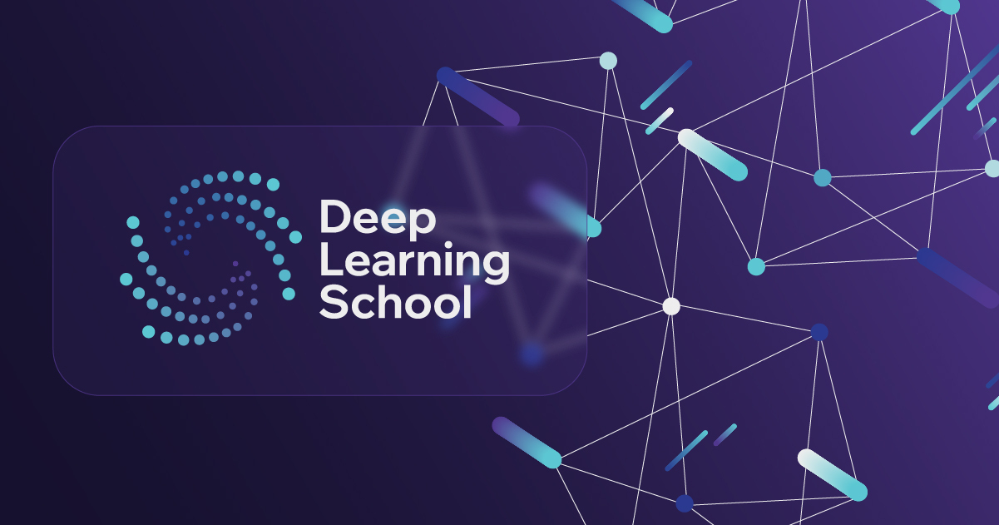


<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Классификация изображений</b></h3>


# Домашнее задание. Классификация изображений

Сегодня вам предстоить помочь телекомпании FOX в обработке их контента. Как вы знаете, сериал "Симпсоны" идет на телеэкранах более 25 лет, и за это время скопилось очень много видеоматериала. Персоонажи менялись вместе с изменяющимися графическими технологиями, и Гомер Симпсон-2018 не очень похож на Гомера Симпсона-1989. В этом задании вам необходимо классифицировать персонажей, проживающих в Спрингфилде. Думаю, нет смысла представлять каждого из них в отдельности.



В нашем тесте будет 990 картнок, для которых вам будет необходимо предсказать класс.

### Установка зависимостей

In [2]:
# we will verify that GPU is enabled for this notebook
# following should print: CUDA is available!  Training on GPU ...
#
# if it prints otherwise, then you need to enable GPU:
# from Menu > Runtime > Change Runtime Type > Hardware Accelerator > GPU

import torch
import numpy as np

train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!unzip /content/drive/MyDrive/journey-springfield.zip -d /content/simpsons

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1025.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1026.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1027.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1028.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1029.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1030.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1031.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1032.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1033.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1034.jpg  
  inflating: /content/simpsons/train/simpsons_dataset/moe_szyslak/pic_1035.jpg  
  inflating: /content/simpsons/train/simp

In [5]:
!ls train

ls: cannot access 'train': No such file or directory


In [6]:
!ls data

ls: cannot access 'data': No such file or directory


In [7]:
!ls data/train

ls: cannot access 'data/train': No such file or directory


In [8]:
!nvidia-smi
import torch
torch.cuda.is_available()

Tue Jul  1 12:27:29 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   40C    P8              9W /   70W |       2MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

True

In [9]:
import pickle
import numpy as np
from skimage import io
import pandas as pd

from tqdm import tqdm, tqdm_notebook
from PIL import Image
from pathlib import Path

from torchvision import transforms
from multiprocessing.pool import ThreadPool
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn

from matplotlib import colors, pyplot as plt
%matplotlib inline

# в sklearn не все гладко, чтобы в colab удобно выводить картинки
# мы будем игнорировать warnings
import warnings
warnings.filterwarnings(action='ignore', category=DeprecationWarning)


In [10]:
# это пакет для проверки версий других пакетов
import pkg_resources

In [11]:
!python --version

Python 3.11.13


In [12]:
for b in ['torch', 'torchvision', 'tqdm', 'matplotlib', 'seaborn', 'Pillow']:
    print(b + ' version: '+ pkg_resources.get_distribution(b).version)

torch version: 2.6.0+cu124
torchvision version: 0.21.0+cu124
tqdm version: 4.67.1
matplotlib version: 3.10.0
seaborn version: 0.13.2
Pillow version: 11.2.1


#### Версии питона и библиотек, на которых работал эталонный ноутбук:

Python 3.11.11

torch version: 2.5.1+cu124

torchvision version: 0.20.1+cu124

tqdm version: 4.67.1

matplotlib version: 3.10.0

seaborn version: 0.13.2

Pillow version: 11.1.0


In [13]:
# разные режимы датасета
DATA_MODES = ['train', 'val', 'test']
# все изображения будут масштабированы к размеру 224x224 px
RESCALE_SIZE = 224
# работаем на видеокарте
DEVICE = torch.device("cuda")

Полезная статья, которой мы вдохновились при создании класса `SimpsonsDataset`:

https://jhui.github.io/2018/02/09/PyTorch-Data-loading-preprocess_torchvision/

Ниже мы исспользуем враппер над датасетом для удобной работы. Вам стоит понимать, что происходит с LabelEncoder и  с torch.Transformation.

`ToTensor` конвертирует  `PIL Image` с параметрами в диапазоне $[0, 255]$ (как все пиксели) в `FloatTensor` размера ($C \times H \times W$) $[0,1]$ , затем производится масштабирование:
$\text{input} = \frac{\text{input} - \mu}{\text{standard deviation}} $, <br>       константы - средние и дисперсии по каналам на основе ImageNet


Стоит также отметить, что мы переопределяем метод __getitem__ для удобства работы с данной структурой данных.
 Также используется LabelEncoder для преобразования строковых меток классов в id и обратно. В описании датасета указано, что картинки разного размера, так как брались напрямую с видео, поэтому следуем привести их к одному размеру (это делает метод  _prepare_sample).

In [14]:
class SimpsonsDataset(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files, mode):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        # режим работы
        self.mode = mode

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)

        self.label_encoder = LabelEncoder()

        if self.mode != 'test':
            self.labels = [path.parent.name for path in self.files]
            self.label_encoder.fit(self.labels)

            with open('label_encoder.pkl', 'wb') as le_dump_file:
                  pickle.dump(self.label_encoder, le_dump_file)

    def __len__(self):
        return self.len_

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа
        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])
        x = self.load_sample(self.files[index])
        x = self._prepare_sample(x)
        x = np.array(x / 255, dtype='float32')
        x = transform(x)
        if self.mode == 'test':
            return x
        else:
            label = self.labels[index]
            label_id = self.label_encoder.transform([label])
            y = label_id.item()
            return x, y

    def _prepare_sample(self, image):
        image = image.resize((RESCALE_SIZE, RESCALE_SIZE))
        return np.array(image)

In [15]:
def imshow(inp, title=None, plt_ax=plt, default=False):
    """Imshow для тензоров"""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt_ax.imshow(inp)
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)

In [16]:
#определим директории с тренировочными и тестовыми файлами
TRAIN_DIR = Path('/content/simpsons/train/')
TEST_DIR = Path('/content/simpsons/testset/')

In [17]:
train_val_files = sorted(list(TRAIN_DIR.rglob('*.jpg')))
test_files = sorted(list(TEST_DIR.rglob('*.jpg')))

In [18]:
from sklearn.model_selection import train_test_split

train_val_labels = [path.parent.name for path in train_val_files]
train_files, val_files = train_test_split(train_val_files, test_size=0.25, \
                                          stratify=train_val_labels)

In [19]:
val_dataset = SimpsonsDataset(val_files, mode='val')

In [20]:
# uncomment if you have problem with pillow
# def register_extension(id, extension): Image.EXTENSION[extension.lower()] = id.upper()
# Image.register_extension = register_extension
# def register_extensions(id, extensions):
#     for extension in extensions: register_extension(id, extension)
# Image.register_extensions = register_extensions

**!** Обратите внимание, что возможно, датасет требует дополнительной фильтрации, так как лейблы не всегда точно соответствуют картинкам.

Давайте посмотрим на наших героев внутри датасета.

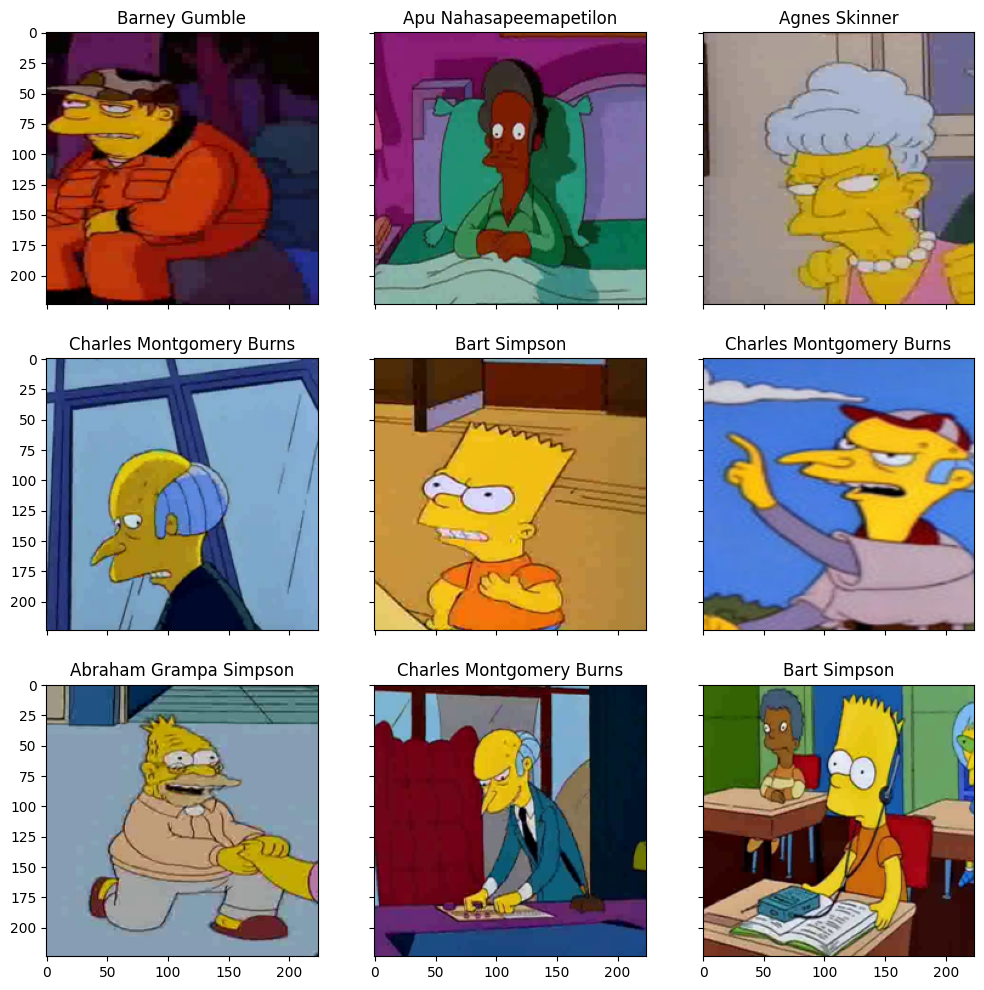

In [21]:
fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)
for fig_x in ax.flatten():
    random_characters = int(np.random.uniform(0,1000))
    im_val, label = val_dataset[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                val_dataset.label_encoder.inverse_transform([label])[0].split('_')))
    imshow(im_val.data.cpu(), \
          title=img_label,plt_ax=fig_x)

Можете добавить ваши любимые сцены и классифицировать их. (веселые результаты можно кидать в чат)

### Построение нейросети

Запустить данную сеть будет вашим мини-заданием на первую неделю, чтобы было проще участвовать в соревновании.

Данная архитектура будет очень простой и нужна для того, чтобы установить базовое понимание и получить простенький сабмит на Kaggle.

<!-- Здесь вам предлагается дописать сверточную сеть глубины 4/5.  -->

*Описание слоев*:



1. размерность входа: $3\times 224 \times 224$
2.размерности после слоя:  $8 \times 111 \times 111$
3. $16 \times 54 \times 54$
4. $32 \times 26 \times 26$
5. $64 \times 12 \times 12$
6. выход: $96 \times 5 \times 5$

О том, как работают свёртки подробней можно прочитать в документации Pytorch на функцию `Conv2d`:

https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html

Калькулятор свёрток:

https://madebyollin.github.io/convnet-calculator/

#### Модель

In [22]:
class SimpleCnn(nn.Module):
    """
    Очень простая сверточная нейронная сеть для классификации изображений.

    Эта сеть состоит из пяти сверточных слоев, каждый из которых
    включает в себя операцию свертки, функцию активации ReLU и операцию
    пулинга (max-pooling). На выходе используется полносвязный слой
    для классификации на заданное количество классов.

    Параметры:
    ----------
    n_classes : int
        Количество классов для классификации.

    Примечание:
    ----------
    Входные изображения должны иметь размерность (3, H, W), где
    3 - слои rgb для цветной картинки, а H и W - высота и ширина изображения,
    соответственно. Размер выходного тензора будет равен (n_classes).

    Методы:
    -------
    forward(x):
        Пропускает входные данные через сеть и возвращает логиты для
        каждого класса.
    """

    def __init__(self, n_classes, name = 'simple_cnn'):
        super().__init__()
        self.name = name
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=96, kernel_size=3),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.out = nn.Linear(96 * 5 * 5, n_classes)


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)

        x = x.view(x.size(0), -1)
        logits = self.out(x)
        return logits

#### Функция обучения:

In [23]:
from tqdm.notebook import tqdm

def fit_epoch(model, train_loader, criterion, optimizer, lr_sheduler = None):
    """
    Функция обучает модель на одной эпохе, используя предоставленный dataloader.

    Эта функция проходит по всем данным в `train_loader`, выполняет шаг моделью (forward),
    вычисляет лосс, выполняет обратное распространение с помощью заданного
    оптимизатора и обновляет веса модели.
    В конце эпохи возвращаются средний лосс и
    точность на обучающем наборе данных.

    Параметры:
    ----------
    model : nn.Module
        Модель, которую необходимо обучить. Должна быть экземпляром класса
        PyTorch `nn.Module`.

    train_loader : DataLoader
        Загрузчик данных, который предоставляет батчи входных данных и
        соответствующих меток. Должен возвращать кортежи (inputs, labels).

    criterion : nn.Module
        Функция потерь, используемая для вычисления ошибки между
        предсказаниями модели и истинными метками.

    optimizer : torch.optim.Optimizer
        Оптимизатор, используемый для обновления весов модели на основе
        градиентов, вычисленных в процессе обучения.

    Функция возвращает:
    ----------
    tuple
        Кортеж, содержащий средний лосс (train_loss) и точность (train_acc)
        на обучающем наборе данных за текущую эпоху.
    """

    running_loss = 0.0
    running_corrects = 0
    processed_data = 0
    model.train()
    for inputs, labels in tqdm(train_loader, desc = 'batch'):
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)
        optimizer.zero_grad()

        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        preds = torch.argmax(outputs, 1)
        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)
        processed_data += inputs.size(0)


    if lr_sheduler:
      lr_sheduler.step()
    train_loss = running_loss / processed_data
    train_acc = running_corrects.cpu().numpy() / processed_data
    return train_loss, train_acc

#### Функция валидации:

In [24]:
def eval_epoch(model, val_loader, criterion):
    """
    Функция оценивает работу модели на валидационном наборе данных за одну эпоху.

    Эта функция проходит по всем данным в `val_loader`, выполняет прямое
    распространение, вычисляет лосс и точность модели. В конце эпохи
    возвращаются средний лосс и точность на валидационном наборе данных.

    Параметры:
    ----------
    model : nn.Module
        Модель, которую необходимо оценить. Должна быть экземпляром класса
        PyTorch `nn.Module`.

    val_loader : DataLoader
        Загрузчик данных, который предоставляет батчи входных данных и
        соответствующих меток для валидации. Должен возвращать кортежи
        (inputs, labels).

    criterion : nn.Module
        Функция потерь, используемая для вычисления ошибки между
        предсказаниями модели и истинными метками.

    Функция возвращает:
    ----------
    tuple
        Кортеж, содержащий среднюю потерю (val_loss) и точность (val_acc)
        на валидационном наборе данных за текущую эпоху.
    """
    model.eval()
    running_loss = 0.0
    running_corrects = 0
    processed_size = 0

    for inputs, labels in tqdm(val_loader, desc = 'batch'):
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)

        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            preds = torch.argmax(outputs, 1)

        running_loss += loss.item() * inputs.size(0)
        running_corrects += torch.sum(preds == labels.data)
        processed_size += inputs.size(0)
    val_loss = running_loss / processed_size
    val_acc = running_corrects.double() / processed_size
    return val_loss, val_acc

#### Полный цикл обучения

In [25]:
from datetime import datetime

PATH_TO_MODELS = '/content/drive/MyDrive/simpsons_hw/'



def train(train_files, val_files, model, epochs, batch_size, wrs = None, lr = None, lr_sheduler = False):
    """
    Функция обучает модель на обучающем наборе данных и оценивает ее на валидационном наборе данных.

    Эта функция создает загрузчики данных для обучающего и валидационного наборов,
    а затем выполняет обучение модели в течение заданного количества эпох.
    В конце каждой эпохи выводятся значения потерь и точности для обучающего и
    валидационного наборов. История обучения сохраняется и возвращается.

    Параметры:
    ----------
    train_files : list
        Список файлов или путей к файлам, содержащим обучающие данные.

    val_files : list
        Список файлов или путей к файлам, содержащим валидационные данные.

    model : nn.Module
        Модель, которую необходимо обучить. Должна быть экземпляром класса
        PyTorch `nn.Module`.

    epochs : int
        Количество эпох для обучения модели.

    batch_size : int
        Размер батча, используемый для загрузки данных.

    Возвращает:
    ----------
    list
        Список, содержащий кортежи (train_loss, train_acc, val_loss, val_acc)
        для каждой эпохи, где:
        - train_loss: средняя потеря на обучающем наборе.
        - train_acc: точность на обучающем наборе.
        - val_loss: средняя потеря на валидационном наборе.
        - val_acc: точность на валидационном наборе.
    """
    if not wrs is None:
      train_loader = DataLoader(train_dataset, batch_size=batch_size, sampler = wrs)
    else:
      train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

    history = []
    log_template = "\nEpoch {ep:03d} train_loss: {t_loss:0.4f} \
    val_loss {v_loss:0.4f} train_acc {t_acc:0.4f} val_acc {v_acc:0.4f}"

    with tqdm(desc="epoch", total=epochs) as pbar_outer:
        if lr is list:
          opt = torch.optim.Adam(lr)
        elif lr is float:
          opt = torch.optim.Adam(model.parameters(), lr = lr)
        else:
          opt = torch.optim.Adam(model.parameters())

        criterion = nn.CrossEntropyLoss()
        lr_scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=5, gamma=0.1)

        for epoch in range(epochs):
            train_loss, train_acc = fit_epoch(model, train_loader, criterion, opt,
                                              lr_sheduler=lr_scheduler if lr_sheduler else None)
            print("loss", train_loss)

            val_loss, val_acc = eval_epoch(model, val_loader, criterion)
            history.append((train_loss, train_acc, val_loss, val_acc))

            pbar_outer.update(1)
            tqdm.write(log_template.format(ep=epoch+1, t_loss=train_loss,\
                                           v_loss=val_loss, t_acc=train_acc, v_acc=val_acc))
            # save best model
            if len(history) > 1:
              if val_loss <= history[-2][-2]:
                torch.save(model.state_dict(), PATH_TO_MODELS + model.name + '_'+ str(datetime.now()))


    return history

#### Применение модели к данным

In [26]:
def predict(model, test_loader):
    """
    Функция выполняет предсказание классов для тестового набора данных с использованием обученной модели.

    Эта функция принимает модель и загрузчик тестовых данных, применяет модель к
    изображениям и возвращает вероятности предсказанных классов.

    Параметры:
    ----------
    model : nn.Module
        Обученная модель, которая будет использоваться для предсказания.
        Должна быть экземпляром класса PyTorch `nn.Module`.

    test_loader : DataLoader
        Загрузчик данных, который предоставляет батчи входных данных для тестирования.
        Должен возвращать тензоры входных данных.

    Возвращает:
    ----------
    numpy.ndarray
        Массив вероятностей предсказанных классов для каждого примера в тестовом наборе.
        Размерность массива будет (N, C), где N - количество примеров, а C - количество классов.
    """

    with torch.no_grad():
        logits = []

        for inputs in test_loader:
            inputs = inputs.to(DEVICE)
            model.eval()
            outputs = model(inputs).cpu()
            logits.append(outputs)

    probs = nn.functional.softmax(torch.cat(logits), dim=-1).numpy()
    return probs

In [27]:
n_classes = len(np.unique(train_val_labels))
simple_cnn = SimpleCnn(n_classes).to(DEVICE)
print("we will classify :{}".format(n_classes))
print(simple_cnn)

we will classify :42
SimpleCnn(
  (conv1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv4): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv5): Sequential(
    (0): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (out): Linear(in_features=2400, out_fea

Запустим обучение сети.

In [28]:
if val_dataset is None:
    val_dataset = SimpsonsDataset(val_files, mode='val')

train_dataset = SimpsonsDataset(train_files, mode='train')

In [ ]:
history = train(train_dataset, val_dataset, model=simple_cnn, epochs=10, batch_size=64) # увеличить батчсайз - проверить изменится ли результат
# добавить сохранение лучшей версии модели в фукнцию обучения

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.4311803065482898


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.4312     val_loss 1.8370 train_acc 0.3279 val_acc 0.5105


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.5305873550528273


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.5306     val_loss 1.3629 train_acc 0.5771 val_acc 0.6299


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.0727619427056425


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 1.0728     val_loss 1.1016 train_acc 0.7004 val_acc 0.7058


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.8036493648768337


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.8036     val_loss 0.9917 train_acc 0.7711 val_acc 0.7386


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6114131887746211


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.6114     val_loss 1.0011 train_acc 0.8250 val_acc 0.7512


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4699163684891139


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.4699     val_loss 1.0385 train_acc 0.8609 val_acc 0.7665


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.36981274615549664


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.3698     val_loss 1.0804 train_acc 0.8882 val_acc 0.7623


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2925509992272423


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.2926     val_loss 1.0941 train_acc 0.9118 val_acc 0.7736


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.22269902141547993


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.2227     val_loss 1.2557 train_acc 0.9318 val_acc 0.7669


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.19181769252909286


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1918     val_loss 1.2965 train_acc 0.9379 val_acc 0.7765


Построим кривые обучения

In [ ]:
loss, acc, val_loss, val_acc = zip(*history)

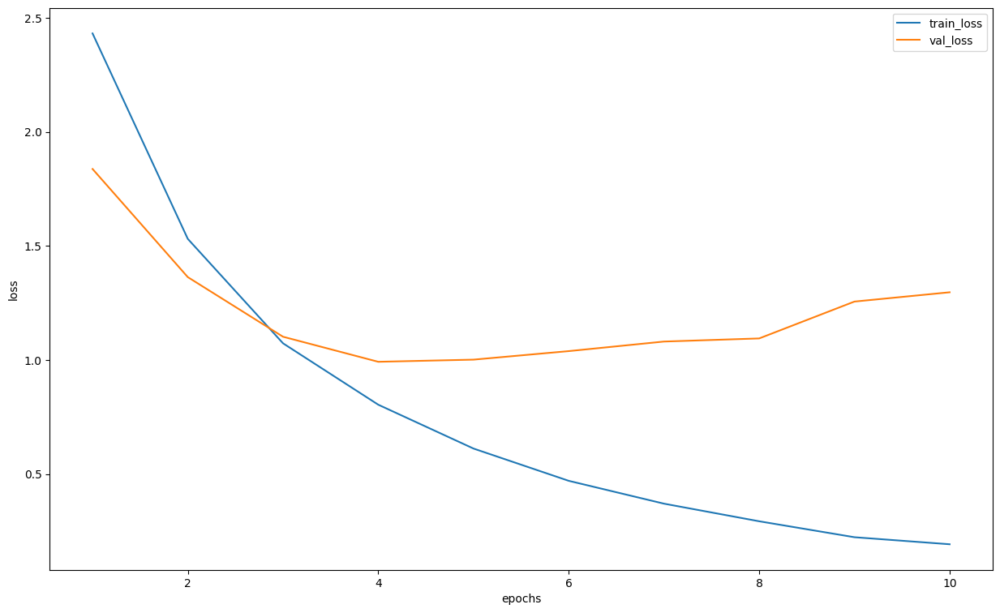

In [ ]:

plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], loss, label="train_loss")
plt.plot([i+1 for i in range(10)],val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

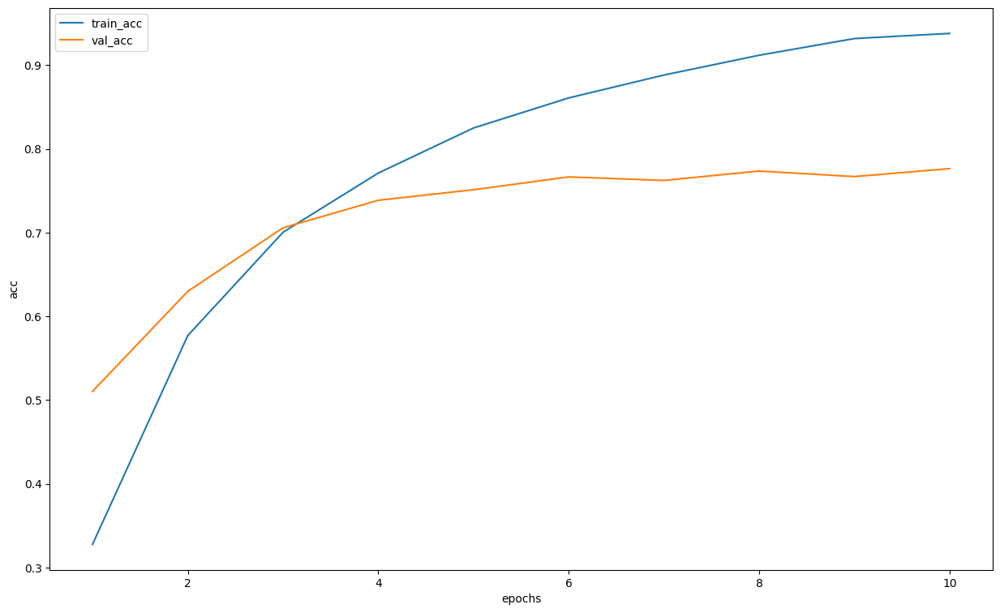

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], [float(x) for x in acc], label="train_acc")
plt.plot([i+1 for i in range(10)], [float(x) for x in val_acc], label="val_acc")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("acc")
plt.show()

In [ ]:
!mkdir /content/drive/MyDrive/simpsons_hw

In [ ]:
!mkdir /content/drive/MyDrive/simpsons_hw/simple_cnn

In [ ]:
torch.save(simple_cnn.state_dict(), '/content/drive/MyDrive/simpsons_hw/simple_cnn/14jun_1629')

In [ ]:
loaded_model = SimpleCnn(n_classes)
loaded_model.load_state_dict(torch.load('/content/drive/MyDrive/simpsons_hw/simple_cnn/14jun_1629', weights_only=True))
loaded_model.to(DEVICE)
loaded_model.eval()

SimpleCnn(
  (conv1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv4): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv5): Sequential(
    (0): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (out): Linear(in_features=2400, out_features=42, bias=True)


### Ну и что теперь со всем этим делать?

![alt text](https://www.indiewire.com/wp-content/uploads/2014/08/the-simpsons.jpg)

Хорошо бы понять, как сделать сабмит.
У нас есть сеть и методы eval у нее, которые позволяют перевести сеть в режим предсказания. Стоит понимать, что у нашей модели на последнем слое стоит `softmax`, которые позволяет получить вектор вероятностей  того, что объект относится к тому или иному классу. Давайте воспользуемся этим.

In [29]:
def predict_one_sample(model, inputs, device=DEVICE):
    """Предсказание, для одной картинки"""
    with torch.no_grad():
        inputs = inputs.to(device)
        model.eval()
        logit = model(inputs).cpu()
        probs = torch.nn.functional.softmax(logit, dim=-1).numpy()
    return probs

In [ ]:
random_characters = int(np.random.uniform(2,1000))
ex_img, true_label = val_dataset[random_characters]
probs_im = predict_one_sample(loaded_model, ex_img.unsqueeze(0))

In [ ]:
probs_im.max()

np.float32(0.9696863)

In [ ]:
len(val_dataset)

5234

In [ ]:
val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)

preds = []

for batch, y in val_loader:
  out = loaded_model(batch.to(DEVICE))
  probs = torch.nn.functional.softmax(out.cpu(), -1).detach().numpy()
  preds.append(probs)


In [ ]:
label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))

In [ ]:
import numpy as np

preds = np.concat(preds)


In [ ]:
y_pred = np.argmax(preds, -1)

In [ ]:
actual_labels = [val_dataset[id][1] for id in range(len(val_dataset))]

preds_class = [label_encoder.classes_[i] for i in y_pred]

In [ ]:
actual_labels[:10], preds_class[:10]

([0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
 [np.str_('abraham_grampa_simpson'),
  np.str_('principal_skinner'),
  np.str_('abraham_grampa_simpson'),
  np.str_('abraham_grampa_simpson'),
  np.str_('homer_simpson'),
  np.str_('abraham_grampa_simpson'),
  np.str_('abraham_grampa_simpson'),
  np.str_('abraham_grampa_simpson'),
  np.str_('abraham_grampa_simpson'),
  np.str_('abraham_grampa_simpson')])

Обратите внимание, что метрика, которую необходимо оптимизировать в конкурсе -- `f1-score`.

Вычислим целевую метрику на валидационной выборке.

In [ ]:
from sklearn.metrics import f1_score
f1 = f1_score(actual_labels, y_pred, average='micro')

print("F1-оценка:", f1)

F1-оценка: 0.9117309896828429


Сделаем классную визуализацию,  чтобы посмотреть насколько сеть уверена в своих ответах. Можете исспользовать это, чтобы отлаживать правильность вывода.

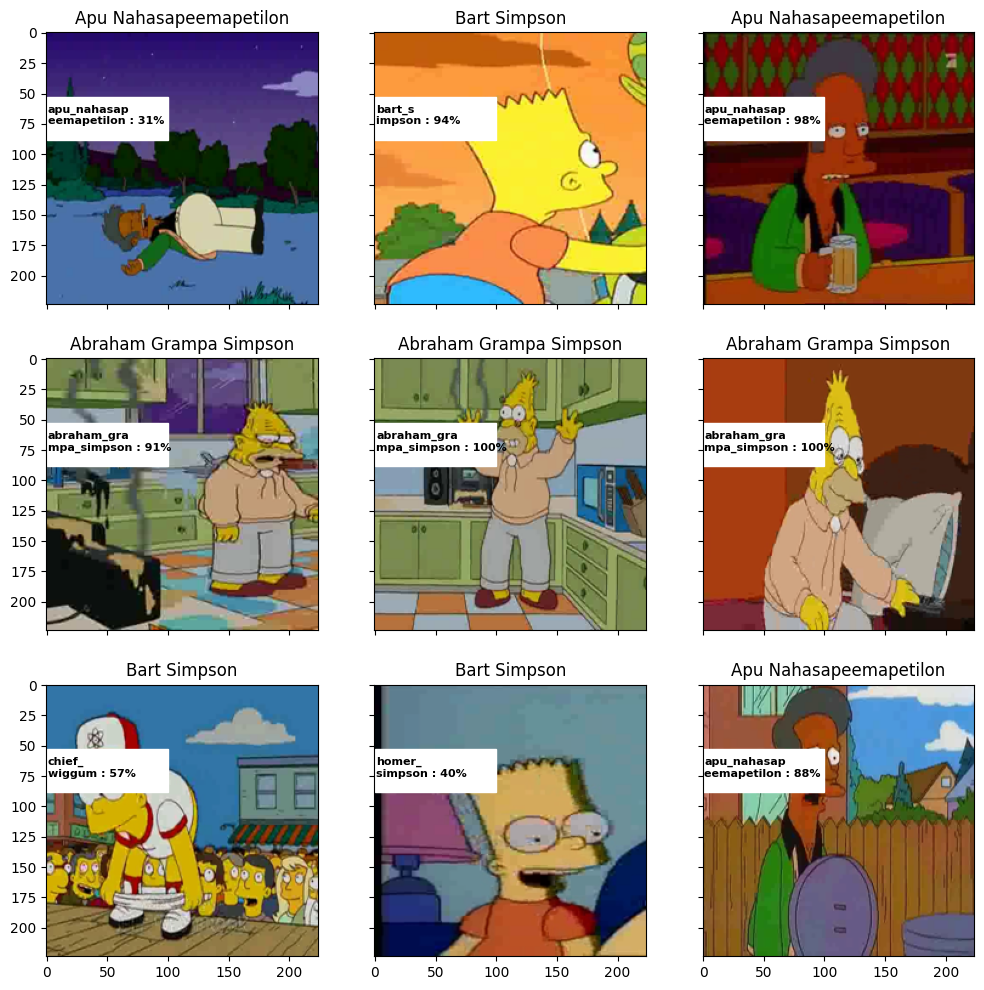

In [ ]:
import matplotlib.patches as patches
from matplotlib.font_manager import FontProperties

fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)
for fig_x in ax.flatten():
    random_characters = int(np.random.uniform(0,1000))
    im_val, label = val_dataset[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                val_dataset.label_encoder.inverse_transform([label])[0].split('_')))



    imshow(im_val.data.cpu(), \
          title=img_label,plt_ax=fig_x)

    actual_text = "Actual : {}".format(img_label)

    fig_x.add_patch(patches.Rectangle((0, 53),100,35,color='white'))
    font0 = FontProperties()
    font = font0.copy()
    #font.set_family("fantasy")
    prob_pred = predict_one_sample(loaded_model, im_val.unsqueeze(0))
    predicted_proba = np.max(prob_pred)*100
    y_pred = np.argmax(prob_pred)

    predicted_label = label_encoder.classes_[y_pred]
    predicted_label = predicted_label[:len(predicted_label)//2] + '\n' + predicted_label[len(predicted_label)//2:]
    predicted_text = "{} : {:.0f}%".format(predicted_label,predicted_proba)

    fig_x.text(1, 59, predicted_text , horizontalalignment='left', fontproperties=font,
                    verticalalignment='top',fontsize=8, color='black',fontweight='bold')

Попробуйте найти те классы, которые сеть не смогла расспознать. Изучите данную проблему, это понадобится в дальнейшем.

### Submit на Kaggle

![alt text](https://i.redd.it/nuaphfioz0211.jpg)

In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(loaded_model, test_loader)


preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]


In [ ]:
! ls

characters_illustration.png  label_encoder.pkl	sample_submission.csv  train
gdrive			     sample_data	testset


In [ ]:
import pandas as pd
my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")
# my_submit = pd.DataFrame({'Image_id': test_filenames, 'Expected': preds})
my_submit.head()

,Id,Expected
0,img0.jpg,bart_simpson
1,img1.jpg,bart_simpson
2,img2.jpg,bart_simpson
3,img3.jpg,bart_simpson
4,img4.jpg,bart_simpson


In [ ]:
my_submit['Expected'] = preds
my_submit['Id'] = test_filenames
my_submit.head()

,Id,Expected
0,img0.jpg,nelson_muntz
1,img1.jpg,bart_simpson
2,img10.jpg,ned_flanders
3,img100.jpg,chief_wiggum
4,img101.jpg,apu_nahasapeemapetilon


In [ ]:
my_submit.to_csv('simple_cnn_baseline.csv', index=False)

In [ ]:
!pip install kaggle

In [ ]:
!kaggle --version

Kaggle API 1.7.4.5


In [ ]:
!mkdir ~/.kaggle

In [32]:
!mkdir ~/.kaggle

In [33]:
!cp /content/drive/MyDrive/kaggle_api_token/kaggle.json ~/.kaggle/

In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_baseline.csv -m 'simple cnn baseline submit'

100% 25.8k/25.8k [00:00<00:00, 41.0kB/s]
Successfully submitted to Journey to Springfield

In [ ]:
!kaggle competitions submissions journey-springfield

fileName                 date                        description                 status                     publicScore  privateScore  
-----------------------  --------------------------  --------------------------  -------------------------  -----------  ------------  
simple_cnn_baseline.csv  2025-06-16 13:14:37.103000  simple cnn baseline submit  SubmissionStatus.COMPLETE  0.91285                    
simple_cnn_baseline.csv  2025-06-16 13:08:43.417000  simple cnn baseline submit  SubmissionStatus.COMPLETE  0.05419                    


## Приключение?

А теперь самое интересное, мы сделали простенькую сверточную сеть и смогли отправить сабмит, но получившийся скор нас явно не устраивает. Надо с этим что-то сделать.

Несколько срочныйх улучшейни для нашей сети, которые наверняка пришли Вам в голову:
1. Работа с датасетом:
* проверка (EDA) и предобработка;
* дополнение, выравниванике кол-ва картинок в классах - изменять можно как сами картинки, формируя новый датасет, или в класссе SimpsonsDataset;
* с помощью [аугментации](https://habr.com/ru/companies/smartengines/articles/264677/) или [без](https://www.geeksforgeeks.org/python-data-augmentation/);

2. Рабта с архитектурой сети:
* учим дольше и изменяем (подбираем) гиперпараметры: learning rate, batch size, нормализация картинки и вот это всё;
* добавление/удаление свёрточных слоёв; <-- тут можно самому реализовать inception слой, skip connection, densnet
* кто же так строит нейронные сети? А где пулинги и батч нормы? Надо добавлять!

3. Улучшение оптимизации:
* ну разве Адам наше все? [adamW](https://www.fast.ai/2018/07/02/adam-weight-decay/) для практика, [статейка для любителей](https://openreview.net/pdf?id=ryQu7f-RZ) (очень хороший анализ), [наши ](https://github.com/MichaelKonobeev/adashift/) эксперименты для заинтересованных.

4. Файнтютинг и трансферлёнинг:
* ну разве это deep learning? Вот ResNet и Inception, которые можно зафайнтьюнить под наши данные, вот это я понимаю (можно и обучить в колабе, а можно и [готовые](https://github.com/Cadene/pretrained-models.pytorch) скачать).

5. Стоит подумать об ансамблях


Надеюсь, что у Вас получится!

![alt text](https://pbs.twimg.com/profile_images/798904974986113024/adcQiVdV.jpg)


## Добавим слоев в fc

In [30]:
class SimpleCnn_3linear(nn.Module):

    def __init__(self, n_classes, name = 'simple_cnn'):
        super().__init__()
        self.name = name
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=96, kernel_size=3),
            nn.BatchNorm2d(96),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.out = nn.Sequential(
            nn.Linear(96 * 5 * 5, 1024*4),
            nn.BatchNorm1d(1024*4),
            nn.Linear(1024*4, 1024*4),
            nn.BatchNorm1d(1024*4),
            nn.Linear(1024*4, n_classes)
        )


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)

        x = x.view(x.size(0), -1)
        logits = self.out(x)
        return logits

In [ ]:
simple_cnn = SimpleCnn_3linear(n_classes).to(DEVICE)

In [ ]:
train_dataset = SimpsonsDataset([*train_files, *val_files], mode='train')

In [ ]:
history = train(train_dataset, val_dataset, model=simple_cnn, epochs=20, batch_size=128)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]

batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 2.0530569175525133


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.0531     val_loss 1.7977 train_acc 0.5184 val_acc 0.5856


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 1.1087707220007446


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.1088     val_loss 0.8731 train_acc 0.7091 val_acc 0.7579


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.7846385384092293


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.7846     val_loss 0.9876 train_acc 0.7885 val_acc 0.7342


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.5970401454004892


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.5970     val_loss 0.4164 train_acc 0.8352 val_acc 0.8697


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.4489516520166468


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.4490     val_loss 0.6517 train_acc 0.8696 val_acc 0.8164


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.37604029895424107


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.3760     val_loss 0.4119 train_acc 0.8908 val_acc 0.8720


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.30258239098332806


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.3026     val_loss 0.5085 train_acc 0.9113 val_acc 0.8624


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.24751089915995533


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.2475     val_loss 0.3001 train_acc 0.9242 val_acc 0.9066


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.25558141200007595


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.2556     val_loss 0.2890 train_acc 0.9219 val_acc 0.9091


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.19473856182701582


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1947     val_loss 0.3329 train_acc 0.9391 val_acc 0.9016


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.18305836303878295


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 011 train_loss: 0.1831     val_loss 0.2827 train_acc 0.9447 val_acc 0.9188


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.15751717979622223


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 012 train_loss: 0.1575     val_loss 0.3650 train_acc 0.9522 val_acc 0.9094


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.16047746451259348


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 013 train_loss: 0.1605     val_loss 0.1470 train_acc 0.9505 val_acc 0.9557


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.13647440129690208


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 014 train_loss: 0.1365     val_loss 0.1162 train_acc 0.9600 val_acc 0.9635


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.12605145166580056


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 015 train_loss: 0.1261     val_loss 0.1525 train_acc 0.9619 val_acc 0.9582


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.1017676940957411


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 016 train_loss: 0.1018     val_loss 0.1332 train_acc 0.9691 val_acc 0.9605


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.10463499346844005


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 017 train_loss: 0.1046     val_loss 0.1299 train_acc 0.9681 val_acc 0.9631


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.10610619459424206


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 018 train_loss: 0.1061     val_loss 0.0927 train_acc 0.9684 val_acc 0.9713


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.08123375521463358


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 019 train_loss: 0.0812     val_loss 0.1070 train_acc 0.9753 val_acc 0.9687


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.10670708132682537


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 020 train_loss: 0.1067     val_loss 0.1356 train_acc 0.9707 val_acc 0.9643


#### Добавим lr_scheduler

In [ ]:
history = train(train_dataset, val_dataset, model=simple_cnn, epochs=20, batch_size=128, lr_sheduler = True)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]

batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.8366249859694658


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.8366     val_loss 0.7498 train_acc 0.7800 val_acc 0.7868


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.5099096143888641


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.5099     val_loss 0.3613 train_acc 0.8518 val_acc 0.8943


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.39120624181630076


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.3912     val_loss 0.9857 train_acc 0.8831 val_acc 0.7690


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.3044545234775871


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.3045     val_loss 0.3992 train_acc 0.9084 val_acc 0.8821


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.23956728656543785


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.2396     val_loss 0.2492 train_acc 0.9270 val_acc 0.9186


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.23484496897361365


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.2348     val_loss 0.2804 train_acc 0.9309 val_acc 0.9178


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.19870254005447527


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.1987     val_loss 0.1907 train_acc 0.9398 val_acc 0.9425


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.18347206028179314


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1835     val_loss 0.2075 train_acc 0.9457 val_acc 0.9375


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.15347151693245165


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1535     val_loss 0.1695 train_acc 0.9529 val_acc 0.9480


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.13909112267533952


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1391     val_loss 0.1748 train_acc 0.9564 val_acc 0.9555


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.1010554967354596


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 011 train_loss: 0.1011     val_loss 0.1088 train_acc 0.9699 val_acc 0.9666


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.10545574432552239


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 012 train_loss: 0.1055     val_loss 0.1769 train_acc 0.9678 val_acc 0.9478


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.12585011260645482


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 013 train_loss: 0.1259     val_loss 0.2256 train_acc 0.9620 val_acc 0.9408


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.1256861228972598


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 014 train_loss: 0.1257     val_loss 0.0938 train_acc 0.9647 val_acc 0.9727


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.11337256086421202


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 015 train_loss: 0.1134     val_loss 0.1378 train_acc 0.9666 val_acc 0.9618


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.0931370048712757


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 016 train_loss: 0.0931     val_loss 0.2128 train_acc 0.9733 val_acc 0.9440


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.09558081022139714


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 017 train_loss: 0.0956     val_loss 0.0895 train_acc 0.9718 val_acc 0.9696


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.09179960491721836


batch:   0%|          | 0/41 [00:00<?, ?it/s]

## Дисбаланс и аугментация

### Light augmentation

(array([ 913.,   42.,  623.,  106., 1342.,   98., 1193.,  986.,   47.,
         469.,    8.,  457.,   27.,   27.,  121., 2246.,  498., 1206.,
         310.,    3., 1354.,  128., 1291.,   71.,  246., 1079.,   17.,
        1452., 1454.,  358.,   32.,   72., 1194.,   65.,   45.,   89.,
         103.,  877.,   40.,   55.,  189.]),
 array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
        13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
        26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
        39., 40., 41.]),
 <BarContainer object of 41 artists>)

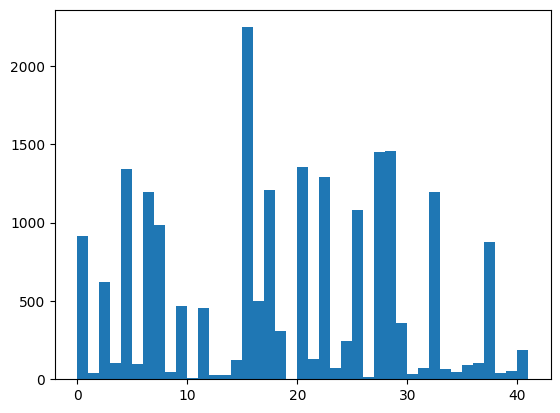

In [ ]:
le = pickle.load(open("label_encoder.pkl", 'rb'))

plt.hist(le.transform(train_val_labels), bins = 41)

In [ ]:
class SimpsonsDatasetAug(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files, mode):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        # режим работы
        self.mode = mode

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)

        self.label_encoder = LabelEncoder()

        if self.mode != 'test':
            self.labels = [path.parent.name for path in self.files]
            self.label_encoder.fit(self.labels)

            with open('label_encoder.pkl', 'wb') as le_dump_file:
                  pickle.dump(self.label_encoder, le_dump_file)

    def __len__(self):
        return self.len_

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа

        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

        x = self.load_sample(self.files[index])
        x = self._prepare_sample(x)
        x = np.array(x / 255, dtype='float32')
        x = transform(x)

        if self.mode == 'train':
          train_aug = transforms.Compose([
              transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
              transforms.RandomHorizontalFlip(p=0.5),
              transforms.RandomApply([
                  transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)
              ], p=0.5),
              transforms.RandomRotation(10)
          ])
          x = train_aug(x)

        if self.mode == 'test':
            return x
        else:
            label = self.labels[index]
            label_id = self.label_encoder.transform([label])
            y = label_id.item()
            return x, y

    def _prepare_sample(self, image):
        image = image.resize((RESCALE_SIZE, RESCALE_SIZE))
        return np.array(image)

In [ ]:
val_dataset_aug = SimpsonsDatasetAug(val_files, mode='val')

train_dataset_aug = SimpsonsDatasetAug(train_files, mode='train')

In [ ]:
train_dataset_aug[0]

(tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]),
 0)

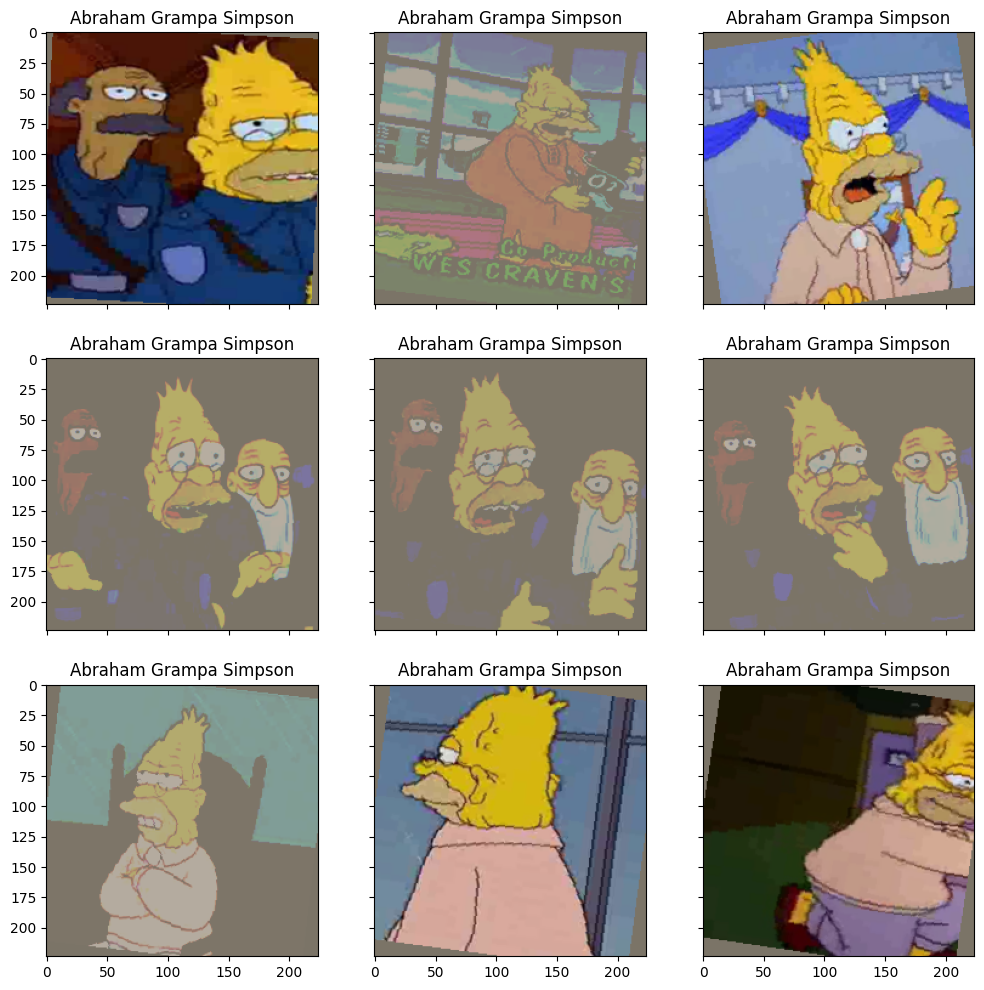

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)

i = iter([i for i in range(10)])

for fig_x in ax.flatten():
    random_characters = next(i)#int(np.random.uniform(0,1000))
    im_val, label = train_dataset_aug[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                train_dataset_aug.label_encoder.inverse_transform([label])[0].split('_')))
    imshow(im_val.cpu(), \
          title=img_label,plt_ax=fig_x)

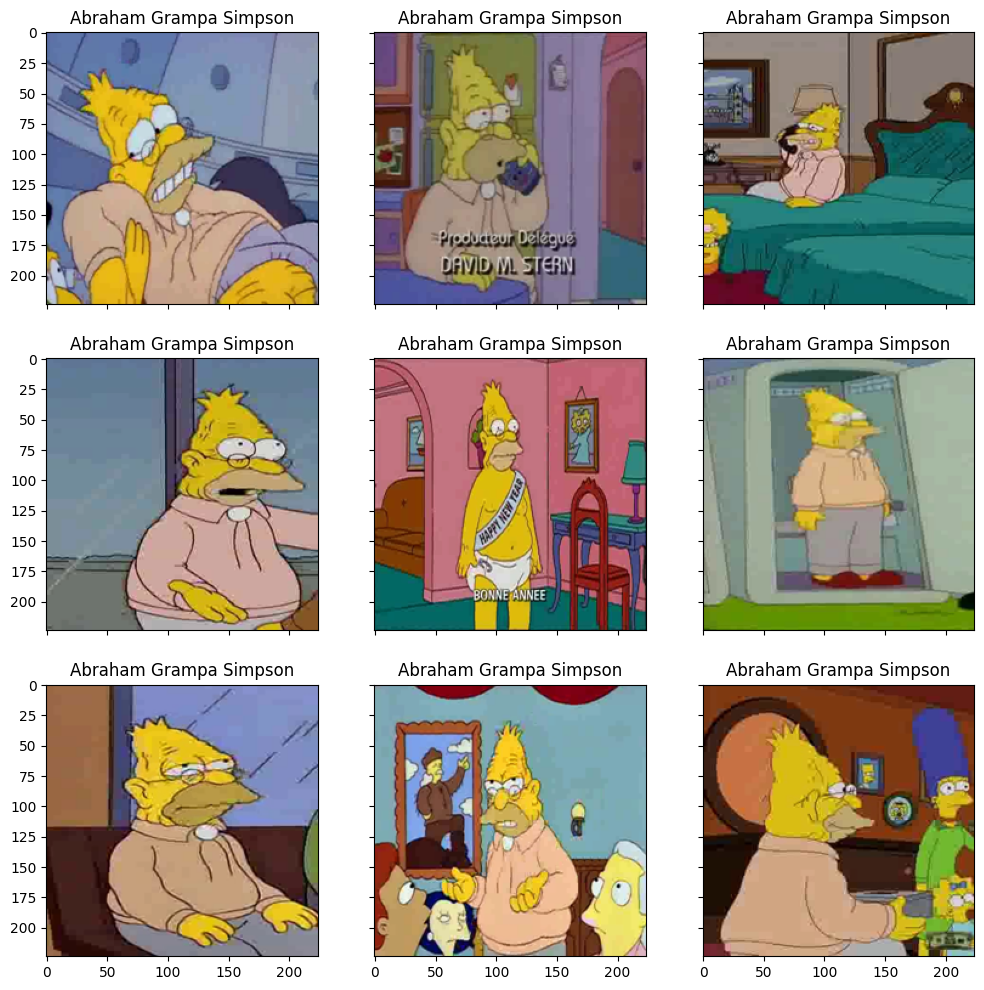

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)

i = iter([i for i in range(10)])

for fig_x in ax.flatten():
    random_characters = next(i)#int(np.random.uniform(0,1000))
    im_val, label = val_dataset_aug[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                val_dataset_aug.label_encoder.inverse_transform([label])[0].split('_')))
    imshow(im_val.cpu(), \
          title=img_label,plt_ax=fig_x)

In [ ]:
simple_cnn_aug = SimpleCnn(n_classes=n_classes, name = 'simple_cnn_aug')
simple_cnn_aug.to(DEVICE)

history = train(train_dataset_aug, val_dataset_aug, model=simple_cnn_aug, epochs=10, batch_size=64)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.6883515437034005


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.6884     val_loss 2.0963 train_acc 0.2547 val_acc 0.4348


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.6563270795086371


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.6563     val_loss 1.4280 train_acc 0.5536 val_acc 0.6217


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.0511729843229676


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 1.0512     val_loss 1.1216 train_acc 0.7118 val_acc 0.7037


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.7276208064470164


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.7276     val_loss 1.0171 train_acc 0.7950 val_acc 0.7386


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5159285673101022


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.5159     val_loss 0.9896 train_acc 0.8544 val_acc 0.7604


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.3798076946880872


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.3798     val_loss 1.0414 train_acc 0.8870 val_acc 0.7640


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.26748983380414704


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.2675     val_loss 1.1301 train_acc 0.9219 val_acc 0.7665


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.19205255697954915


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1921     val_loss 1.1523 train_acc 0.9407 val_acc 0.7835


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.15985635682324467


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1599     val_loss 1.2071 train_acc 0.9511 val_acc 0.7801


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.10149424243439564


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1015     val_loss 1.4519 train_acc 0.9693 val_acc 0.7891


In [ ]:
import pandas as pd

test_dataset = SimpsonsDatasetAug(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(simple_cnn_aug, test_loader)


preds = le.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]

my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")

my_submit['Expected'] = preds
my_submit['Id'] = test_filenames

my_submit.to_csv('/content/simple_cnn_aug.csv', index=False)

In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle_api_token/kaggle.json ~/.kaggle/

In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_aug.csv -m 'added some light augmentation to train dataset'

100% 25.8k/25.8k [00:00<00:00, 42.1kB/s]
400 Client Error: Bad Request for url: https://www.kaggle.com/api/v1/competitions/submissions/submit/journey-springfield


In [ ]:
!kaggle competitions submissions journey-springfield

fileName                 date                        description                 status                     publicScore  privateScore  
-----------------------  --------------------------  --------------------------  -------------------------  -----------  ------------  
simple_cnn_baseline.csv  2025-06-16 13:14:37.103000  simple cnn baseline submit  SubmissionStatus.COMPLETE  0.91285                    
simple_cnn_baseline.csv  2025-06-16 13:08:43.417000  simple cnn baseline submit  SubmissionStatus.COMPLETE  0.05419                    


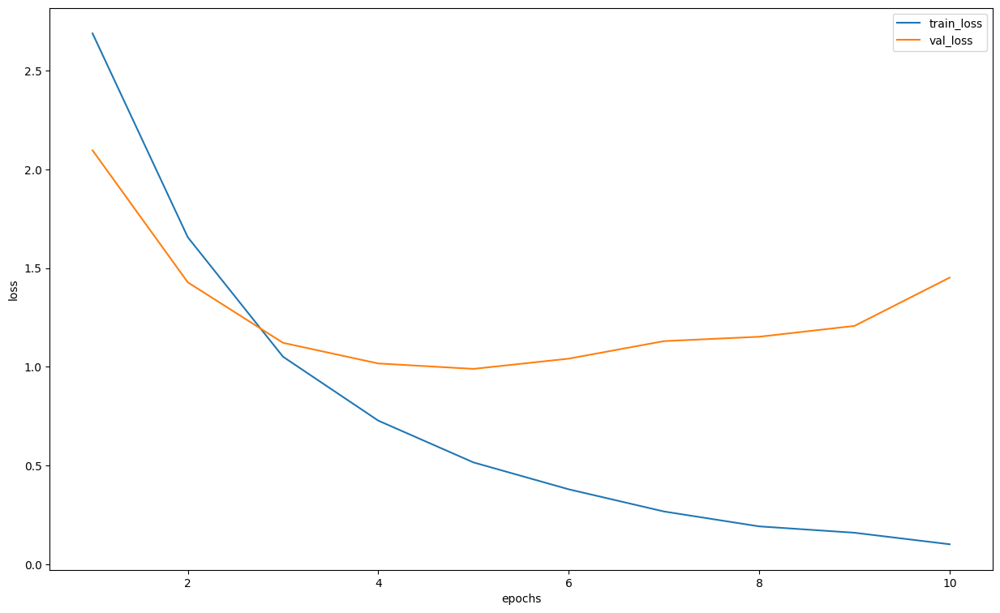

In [ ]:
loss, acc, val_loss, val_acc = zip(*history)

plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], loss, label="train_loss")
plt.plot([i+1 for i in range(10)],val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

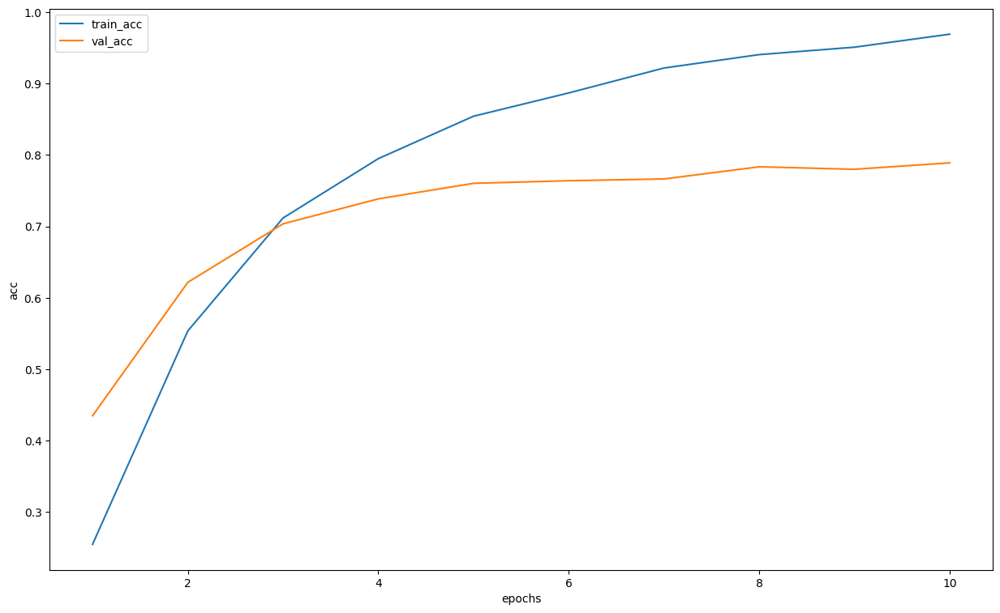

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], [float(x) for x in acc], label="train_acc")
plt.plot([i+1 for i in range(10)], [float(x) for x in val_acc], label="val_acc")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("acc")
plt.show()

### Strong augmentation on train dataset

In [ ]:
class SimpsonsDatasetStrongAug(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files, mode):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        # режим работы
        self.mode = mode

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)

        self.label_encoder = LabelEncoder()

        if self.mode != 'test':
            self.labels = [path.parent.name for path in self.files]
            self.label_encoder.fit(self.labels)

            with open('label_encoder.pkl', 'wb') as le_dump_file:
                  pickle.dump(self.label_encoder, le_dump_file)

    def __len__(self):
        return self.len_

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа

        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

        x = self.load_sample(self.files[index])
        x = self._prepare_sample(x)
        x = np.array(x / 255, dtype='float32')
        x = transform(x)

        if self.mode == 'train':
          train_aug = transforms.Compose([
              transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
              transforms.RandomHorizontalFlip(p=0.5),
              transforms.RandomApply([
                  transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3)
              ], p=0.8),
              transforms.RandomRotation(25)
          ])
          x = train_aug(x)

        if self.mode == 'test':
            return x
        else:
            label = self.labels[index]
            label_id = self.label_encoder.transform([label])
            y = label_id.item()
            return x, y

    def _prepare_sample(self, image):
        image = image.resize((RESCALE_SIZE, RESCALE_SIZE))
        return np.array(image)

In [ ]:
val_dataset_saug = SimpsonsDatasetStrongAug(val_files, mode='val')

train_dataset_saug = SimpsonsDatasetStrongAug(train_files, mode='train')

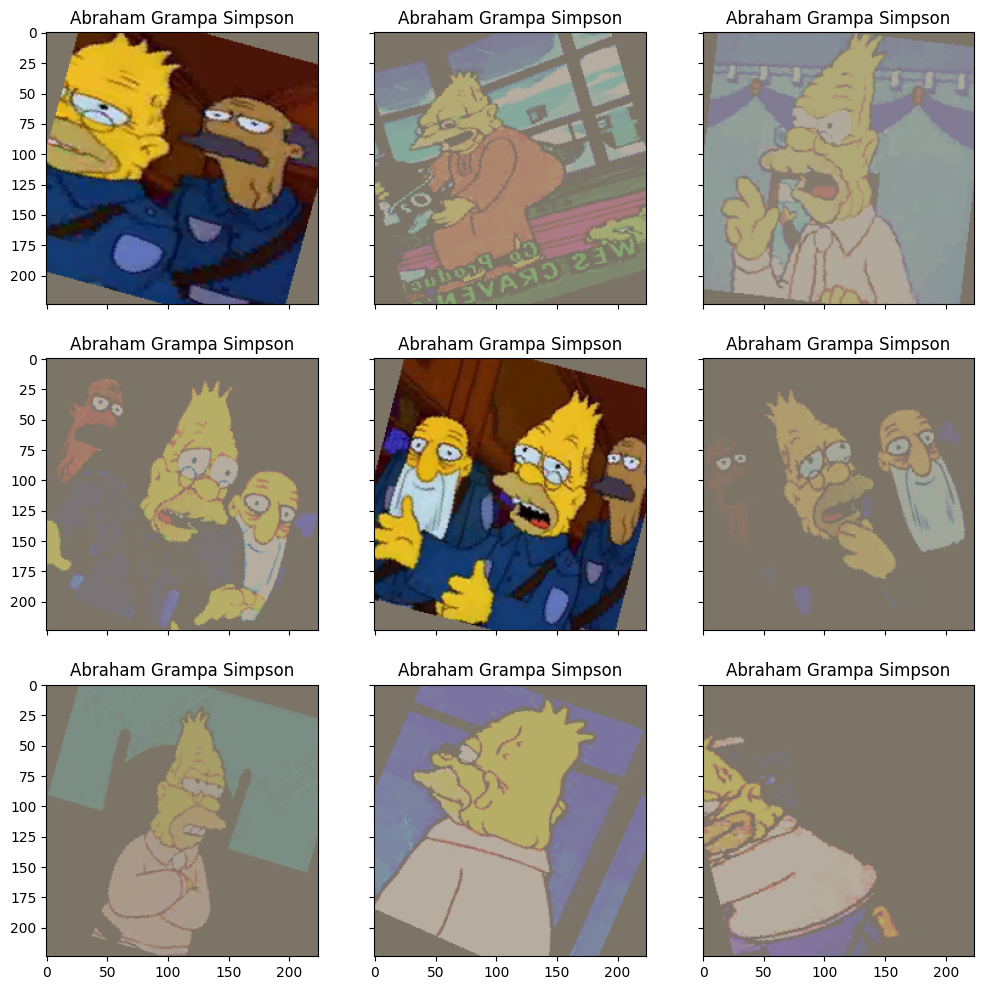

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)

i = iter([i for i in range(10)])

for fig_x in ax.flatten():
    random_characters = next(i)#int(np.random.uniform(0,1000))
    im_val, label = train_dataset_saug[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                train_dataset_saug.label_encoder.inverse_transform([label])[0].split('_')))
    imshow(im_val.cpu(), \
          title=img_label,plt_ax=fig_x)

In [ ]:
simple_cnn_saug = SimpleCnn(n_classes=n_classes, name = 'simple_cnn_strong_aug')
simple_cnn_saug.to(DEVICE)

history = train(train_dataset_saug, val_dataset_saug, model=simple_cnn_saug, epochs=10, batch_size=64)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.546114720359062


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.5461     val_loss 1.9537 train_acc 0.2937 val_acc 0.4648


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.588427896096878


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.5884     val_loss 1.3146 train_acc 0.5595 val_acc 0.6485


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.0502653009717318


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 1.0503     val_loss 1.0353 train_acc 0.7075 val_acc 0.7274


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.7335431053271088


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.7335     val_loss 0.9580 train_acc 0.7935 val_acc 0.7512


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5342235596128783


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.5342     val_loss 0.9082 train_acc 0.8456 val_acc 0.7793


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4022798775360382


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.4023     val_loss 0.9373 train_acc 0.8808 val_acc 0.7789


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.29109660685783784


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.2911     val_loss 0.9888 train_acc 0.9127 val_acc 0.7925


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2116379435269975


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.2116     val_loss 1.0694 train_acc 0.9334 val_acc 0.7877


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.18065645818277806


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1807     val_loss 1.0986 train_acc 0.9429 val_acc 0.7917


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.14860425675642006


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1486     val_loss 1.2192 train_acc 0.9521 val_acc 0.7938


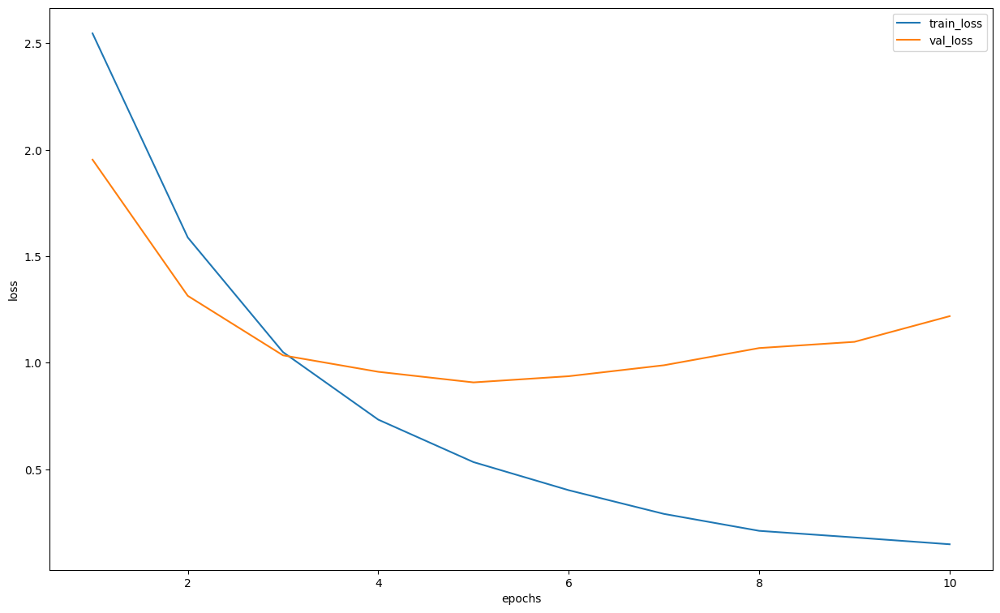

In [ ]:
loss, acc, val_loss, val_acc = zip(*history)

plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], loss, label="train_loss")
plt.plot([i+1 for i in range(10)],val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

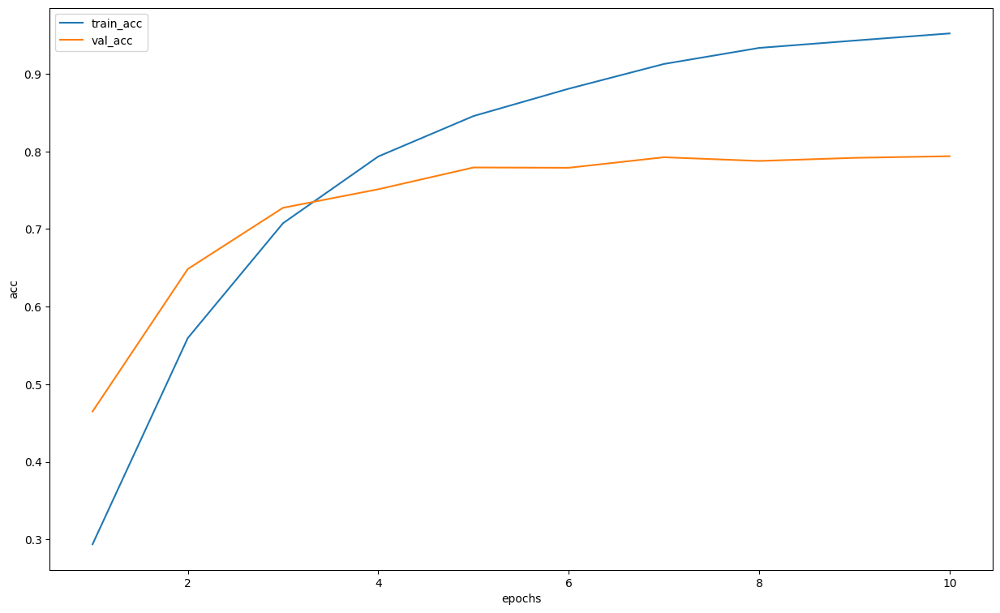

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], [float(x) for x in acc], label="train_acc")
plt.plot([i+1 for i in range(10)], [float(x) for x in val_acc], label="val_acc")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("acc")
plt.show()

### Very strong augmentation

In [ ]:
class SimpsonsDatasetVeryStrongAug(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files, mode):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        # режим работы
        self.mode = mode

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)

        self.label_encoder = LabelEncoder()

        if self.mode != 'test':
            self.labels = [path.parent.name for path in self.files]
            self.label_encoder.fit(self.labels)

            with open('label_encoder.pkl', 'wb') as le_dump_file:
                  pickle.dump(self.label_encoder, le_dump_file)

    def __len__(self):
        return self.len_

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа

        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

        x = self.load_sample(self.files[index])
        x = self._prepare_sample(x)
        x = np.array(x / 255, dtype='float32')
        x = transform(x)

        if self.mode == 'train':
          train_aug = transforms.Compose([
              transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
              transforms.RandomHorizontalFlip(p=0.5),
              transforms.RandomApply([
                  transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3)
              ], p=0.8),
              transforms.RandomRotation(25),
              transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=10), # убрать translate и scale
          ])
          x = train_aug(x)

        if self.mode == 'test':
            return x
        else:
            label = self.labels[index]
            label_id = self.label_encoder.transform([label])
            y = label_id.item()
            return x, y

    def _prepare_sample(self, image):
        image = image.resize((RESCALE_SIZE, RESCALE_SIZE))
        return np.array(image)

In [ ]:
val_dataset_vsaug = SimpsonsDatasetVeryStrongAug(val_files, mode='val')

train_dataset_vsaug = SimpsonsDatasetVeryStrongAug(train_files, mode='train')

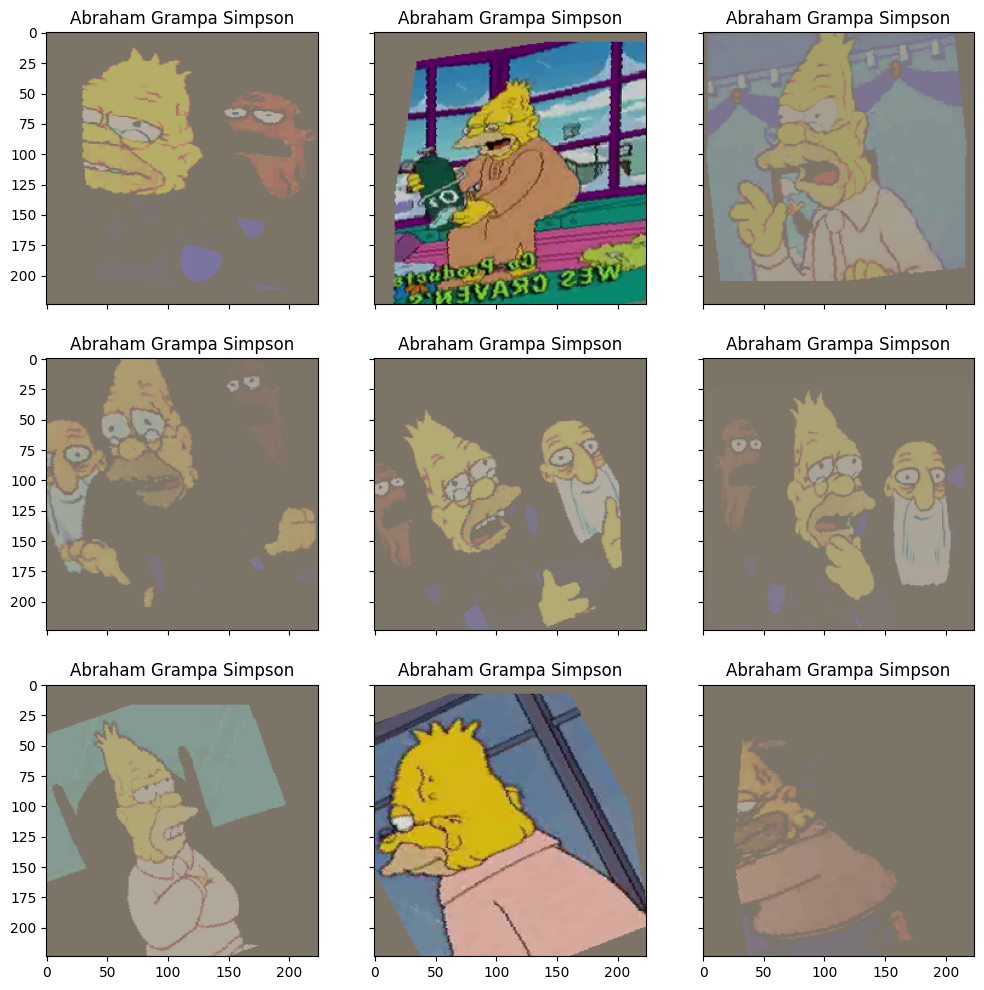

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)

i = iter([i for i in range(10)])

for fig_x in ax.flatten():
    random_characters = next(i)#int(np.random.uniform(0,1000))
    im_val, label = train_dataset_vsaug[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                train_dataset_vsaug.label_encoder.inverse_transform([label])[0].split('_')))
    imshow(im_val.cpu(), \
          title=img_label,plt_ax=fig_x)

In [ ]:
simple_cnn_vsaug = SimpleCnn(n_classes=n_classes, name = 'simple_cnn_very_strong_aug')
simple_cnn_vsaug.to(DEVICE)

history = train(train_dataset_vsaug, val_dataset_vsaug, model=simple_cnn_vsaug, epochs=10, batch_size=64)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.616755955142879


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.6168     val_loss 1.9692 train_acc 0.2743 val_acc 0.4690


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.5289798857976058


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.5290     val_loss 1.3063 train_acc 0.5839 val_acc 0.6593


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.9980654168207939


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.9981     val_loss 1.0960 train_acc 0.7248 val_acc 0.7170


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.7177312008244451


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.7177     val_loss 1.0115 train_acc 0.7985 val_acc 0.7358


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5201558903437737


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.5202     val_loss 0.9242 train_acc 0.8491 val_acc 0.7698


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.37500670319325197


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.3750     val_loss 1.0423 train_acc 0.8925 val_acc 0.7709


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.28929422086356166


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.2893     val_loss 0.9974 train_acc 0.9135 val_acc 0.7895


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.20685231112619062


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.2069     val_loss 1.1072 train_acc 0.9385 val_acc 0.7929


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1710580903131481


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1711     val_loss 1.1905 train_acc 0.9438 val_acc 0.7963


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.13087750294362824


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1309     val_loss 1.2925 train_acc 0.9583 val_acc 0.7959


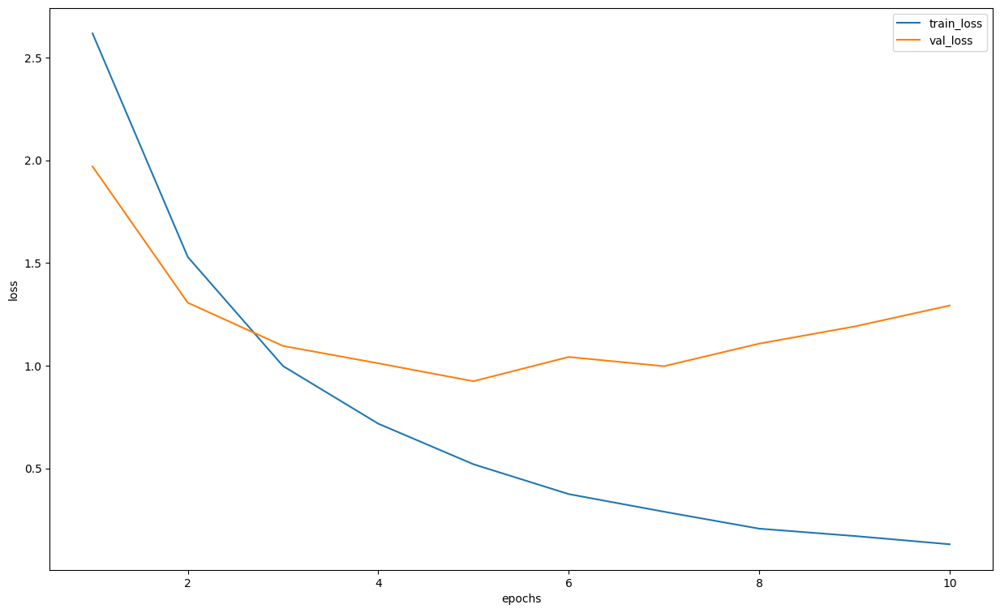

In [ ]:
loss, acc, val_loss, val_acc = zip(*history)

plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], loss, label="train_loss")
plt.plot([i+1 for i in range(10)],val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

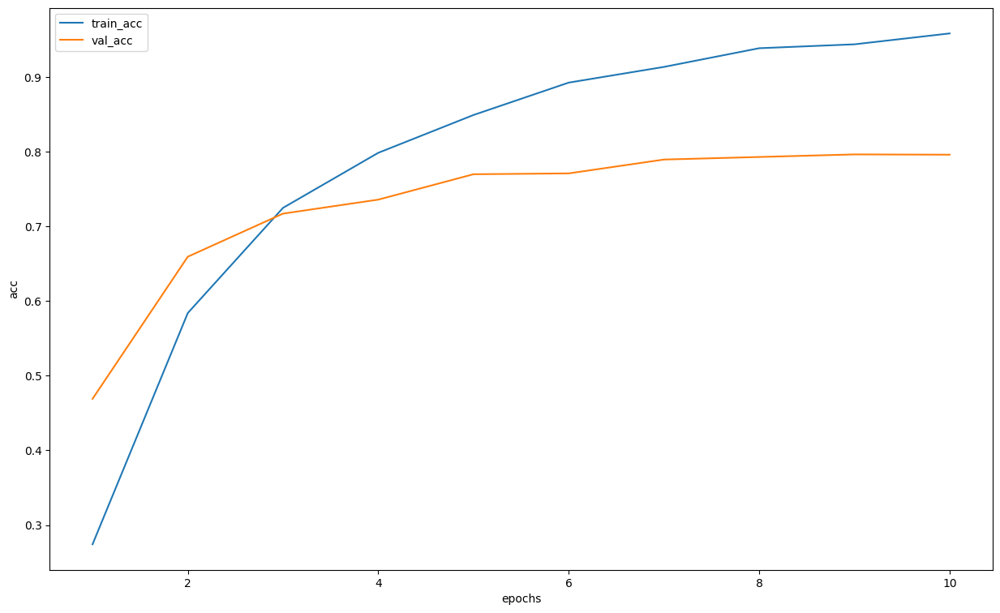

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], [float(x) for x in acc], label="train_acc")
plt.plot([i+1 for i in range(10)], [float(x) for x in val_acc], label="val_acc")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("acc")
plt.show()

### Copy rare class objects and apply augmentatios to them
So we can make classes in the dataset more balanced
using weighted random sampler (with different weights)

Two experiments:
1. Increase weights of rare classes so they could match the frequency of at least 50 elements
2. Decrease weights of common classes while increasing weights of rare classes


Agressivly augment rare classes (less than a 50 objects), strong augmentation (50-100 objects), light augmentation (more than 100)

In [ ]:
classes = [path.parent for path in train_files]
classes_df = pd.Series(classes).value_counts()
classes_df#.mean()

,count
/content/simpsons/train/simpsons_dataset/homer_simpson,1684
/content/simpsons/train/simpsons_dataset/ned_flanders,1090
/content/simpsons/train/simpsons_dataset/moe_szyslak,1089
/content/simpsons/train/simpsons_dataset/lisa_simpson,1015
/content/simpsons/train/simpsons_dataset/bart_simpson,1006
/content/simpsons/train/simpsons_dataset/marge_simpson,968
/content/simpsons/train/simpsons_dataset/krusty_the_clown,904
/content/simpsons/train/simpsons_dataset/principal_skinner,895
/content/simpsons/train/simpsons_dataset/charles_montgomery_burns,895
/content/simpsons/train/simpsons_dataset/milhouse_van_houten,809


In [ ]:
import numpy as np

weights = 1/np.log(classes_df)
weights = weights.to_dict()
weighted_train_files = [weights[f.parent] for f in sorted(train_files)]
weighted_train_files[:10]

[0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528,
 0.15315298723678528]

Now we will modify dataset class, so rare classes could be more augmented, than common ones

In [ ]:
class SimpsonsDatasetAdjustedAugmentation(Dataset):
    """
    Датасет с картинками, который паралельно подгружает их из папок
    производит скалирование и превращение в торчевые тензоры
    """
    def __init__(self, files, mode):
        super().__init__()
        # список файлов для загрузки
        self.files = sorted(files)
        # режим работы
        self.mode = mode

        if self.mode not in DATA_MODES:
            print(f"{self.mode} is not correct; correct modes: {DATA_MODES}")
            raise NameError

        self.len_ = len(self.files)
        self.class_freq = pd.Series([path.parent for path in train_files]).value_counts().to_dict()


        self.label_encoder = LabelEncoder()

        if self.mode != 'test':
            self.labels = [path.parent.name for path in self.files]
            self.label_encoder.fit(self.labels)

            with open('label_encoder.pkl', 'wb') as le_dump_file:
                  pickle.dump(self.label_encoder, le_dump_file)

    def __len__(self):
        return self.len_

    def load_sample(self, file):
        image = Image.open(file)
        image.load()
        return image

    def __getitem__(self, index):
        # для преобразования изображений в тензоры PyTorch и нормализации входа

        transform = transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

        x = self.load_sample(self.files[index])
        x = self._prepare_sample(x)
        x = np.array(x / 255, dtype='float32')
        x = transform(x)

        if self.mode == 'train':
          train_aug = None
          if self.class_freq[self.files[index].parent] < 10:
              train_aug = transforms.Compose([
                transforms.RandomResizedCrop(224, scale=(0.7, 1.0), ratio=(0.9, 1.1)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomApply([
                    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3)
                ], p=0.8),
                transforms.RandomRotation(30),
                transforms.RandomAffine(degrees=0, shear=10)
              ])
          elif  10 <= self.class_freq[self.files[index].parent] < 50:
              train_aug = transforms.Compose([
                transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
                transforms.RandomHorizontalFlip(p=0.5),
                transforms.RandomApply([
                    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)
                ], p=0.5),
                transforms.RandomRotation(25),
                transforms.RandomAffine(degrees=0, shear=5)
              ])
          else:
            train_aug = transforms.Compose([
              transforms.RandomResizedCrop(224, scale=(0.8, 1.0), ratio=(0.9, 1.1)),
              transforms.RandomHorizontalFlip(p=0.5),
              transforms.RandomApply([
                  transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2)
              ], p=0.5),
              transforms.RandomRotation(10),
              transforms.RandomAffine(degrees=0, shear=3)
          ])

          x = train_aug(x)


        if self.mode == 'test':
            return x
        else:
            label = self.labels[index]
            label_id = self.label_encoder.transform([label])
            y = label_id.item()
            return x, y

    def _prepare_sample(self, image):
        image = image.resize((RESCALE_SIZE, RESCALE_SIZE))
        return np.array(image)

In [ ]:
from torch.utils.data import WeightedRandomSampler

sampler = WeightedRandomSampler(
    weights=weighted_train_files,
    num_samples=len(weighted_train_files),
    replacement=True
)

val_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(val_files, mode='val')
train_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(train_files, mode='train')

In [ ]:
import torch
from collections import Counter
import matplotlib.pyplot as plt

def analyze_dataloader_class_distribution(dataloader, num_batches=None):
    """
    Подсчитывает количество вхождений каждого класса в батчах dataloader.

    Args:
        dataloader: torch.utils.data.DataLoader
        num_batches: сколько батчей проверить (по умолчанию — все)
    """
    class_counts = Counter()

    for i, (x, y) in tqdm(enumerate(dataloader)):
        labels = y.tolist() if isinstance(y, torch.Tensor) else y
        class_counts.update(labels)
        if num_batches is not None and i + 1 >= num_batches:
            break

    # Отсортируем по классам
    sorted_classes = sorted(class_counts.keys())
    counts = [class_counts[k] for k in sorted_classes]

    # Печать и визуализация
    print("Class counts:", dict(class_counts))

    plt.figure(figsize=(10, 4))
    plt.bar(sorted_classes, counts)
    plt.xlabel("Class label")
    plt.ylabel("Number of times seen")
    plt.title("Class distribution in sampled DataLoader")
    plt.grid(True)
    plt.show()


In [ ]:
loader = DataLoader(train_dataset_adj_aug, batch_size=64, sampler = sampler)
analyze_dataloader_class_distribution(loader)

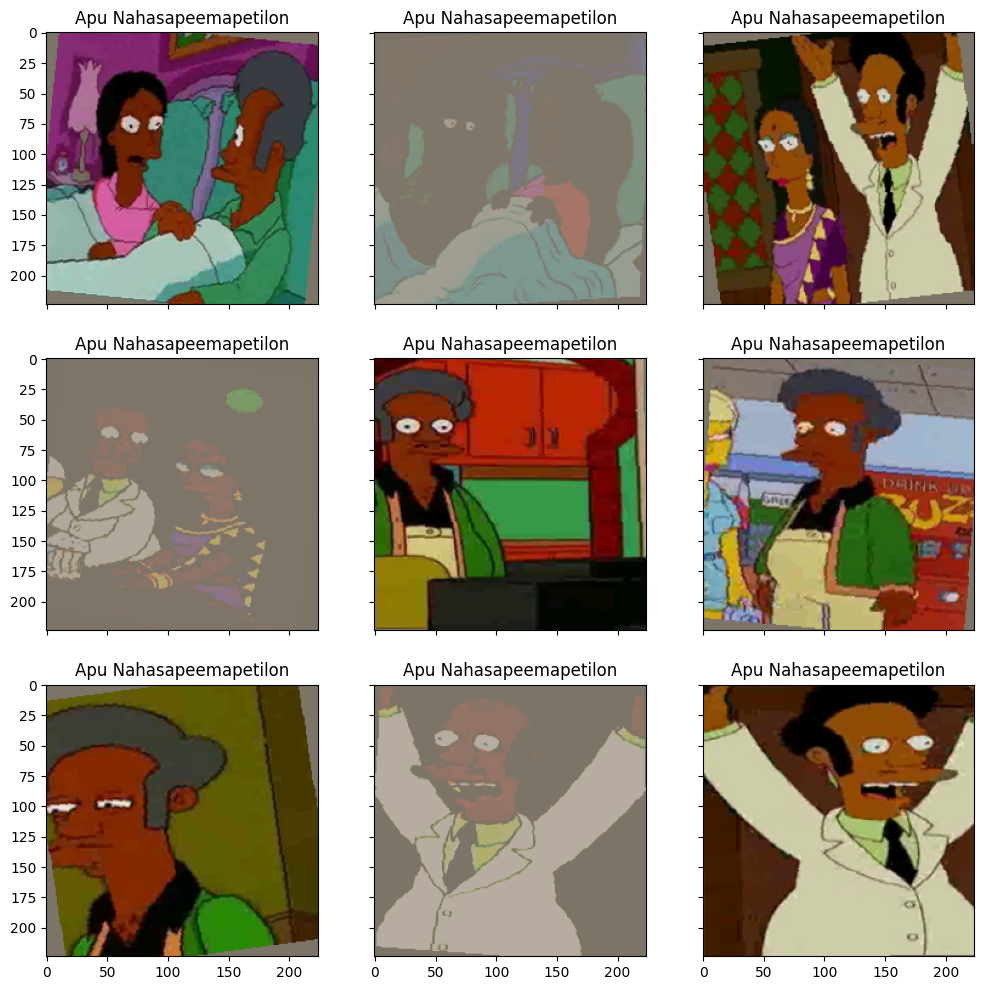

In [ ]:
fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(12, 12), \
                        sharey=True, sharex=True)

i = iter([i for i in range(1000,1010)])

for fig_x in ax.flatten():
    random_characters = next(i)#int(np.random.uniform(0,1000))
    im_val, label = train_dataset_adj_aug[random_characters]
    img_label = " ".join(map(lambda x: x.capitalize(),\
                train_dataset_adj_aug.label_encoder.inverse_transform([label])[0].split('_')))
    imshow(im_val.cpu(), \
          title=img_label,plt_ax=fig_x)

In [ ]:
simple_cnn_vsaug = SimpleCnn(n_classes=n_classes, name = 'simple_cnn_adj_aug_and_oversampling')
simple_cnn_vsaug.to(DEVICE)

history = train(train_dataset_adj_aug, val_dataset_adj_aug, model=simple_cnn_vsaug, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.303661134487672


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.3037     val_loss 2.3186 train_acc 0.4151 val_acc 0.3802


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.0183804749728722


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.0184     val_loss 1.8547 train_acc 0.7418 val_acc 0.5126


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6800127125570778


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.6800     val_loss 1.5625 train_acc 0.8252 val_acc 0.6013


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.49541948536481284


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.4954     val_loss 1.8030 train_acc 0.8714 val_acc 0.5929


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.405181578628819


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.4052     val_loss 1.4998 train_acc 0.8932 val_acc 0.6481


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.32225249122393523


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.3223     val_loss 1.6714 train_acc 0.9166 val_acc 0.6580


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.29068972127924636


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.2907     val_loss 1.4466 train_acc 0.9241 val_acc 0.6754


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2505917745062831


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.2506     val_loss 1.3896 train_acc 0.9305 val_acc 0.7002


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2110925251922358


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.2111     val_loss 1.4907 train_acc 0.9449 val_acc 0.6937


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.19128031235351267


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1913     val_loss 1.3561 train_acc 0.9464 val_acc 0.7153


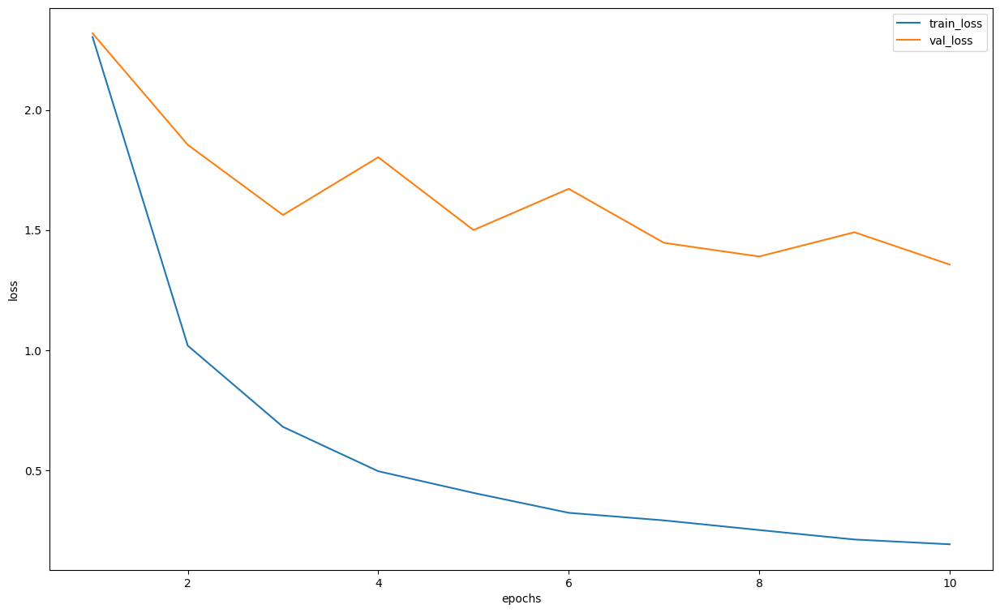

In [ ]:
loss, acc, val_loss, val_acc = zip(*history)

plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], loss, label="train_loss")
plt.plot([i+1 for i in range(10)],val_loss, label="val_loss")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

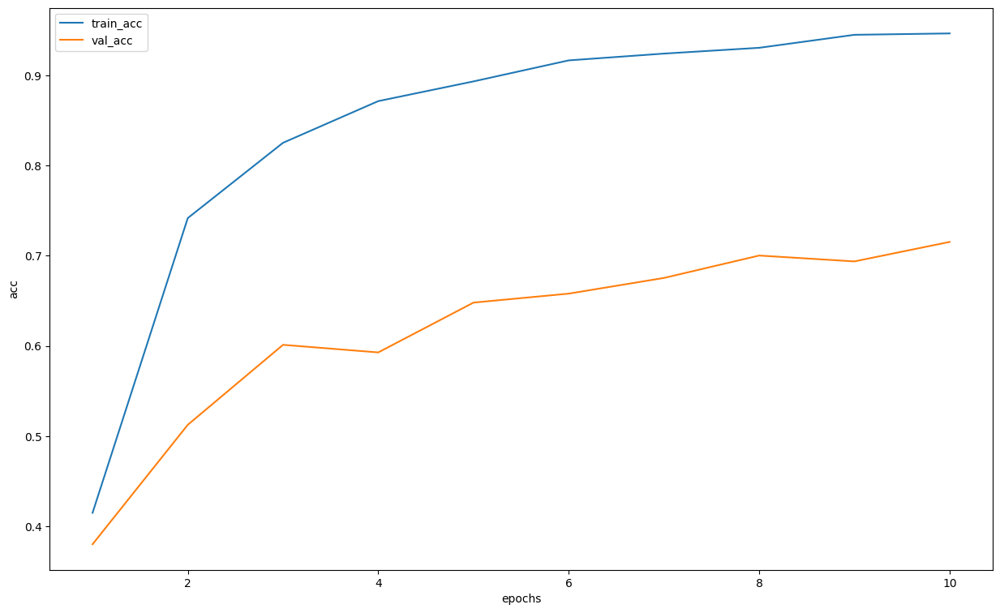

In [ ]:
plt.figure(figsize=(15, 9))
plt.plot([i+1 for i in range(10)], [float(x) for x in acc], label="train_acc")
plt.plot([i+1 for i in range(10)], [float(x) for x in val_acc], label="val_acc")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("acc")
plt.show()

In [ ]:
loaded_model = SimpleCnn(n_classes)
loaded_model.load_state_dict(torch.load('/content/drive/MyDrive/simpsons_hw/simple_cnn_adj_aug_and_oversampling_2025-06-18 14:54:11.005893', weights_only=True))
loaded_model.to(DEVICE)
loaded_model.eval()

SimpleCnn(
  (conv1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv4): Sequential(
    (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (conv5): Sequential(
    (0): Conv2d(64, 96, kernel_size=(3, 3), stride=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (out): Linear(in_features=2400, out_features=42, bias=True)


In [ ]:
from sklearn.metrics import f1_score


val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)

preds = []

for batch, y in val_loader:
  out = loaded_model(batch.to(DEVICE))
  probs = torch.nn.functional.softmax(out.cpu(), -1).detach().numpy()
  preds.append(probs)

label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))
preds = np.concat(preds)
y_pred = np.argmax(preds, -1)

actual_labels = [val_dataset[id][1] for id in range(len(val_dataset))]
preds_class = [label_encoder.classes_[i] for i in y_pred]

f1 = f1_score(actual_labels, y_pred, average='micro')
print("F1-оценка:", f1)

F1-оценка: 0.7883072220099351


- взять более веса пропорциональные частоте

In [ ]:
weights = (1/classes_df)**0.5
weights = weights.to_dict()
weighted_train_files = [weights[f.parent] for f in sorted(train_files)]
weighted_train_files[:10]

[0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351,
 0.03820803599504351]

In [ ]:
from torch.utils.data import WeightedRandomSampler

sampler = WeightedRandomSampler(
    weights=weighted_train_files,
    num_samples=len(weighted_train_files),
    replacement=True
)

val_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(val_files, mode='val')
train_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(train_files, mode='train')

0it [00:00, ?it/s]

Class counts: {6: 695, 32: 694, 13: 103, 28: 761, 4: 759, 2: 496, 7: 635, 38: 139, 15: 991, 9: 441, 3: 222, 36: 203, 37: 595, 20: 782, 27: 786, 5: 213, 16: 449, 22: 764, 25: 691, 0: 647, 21: 245, 29: 387, 12: 140, 17: 688, 14: 249, 8: 128, 23: 177, 31: 155, 24: 290, 41: 289, 11: 430, 39: 125, 35: 210, 40: 68, 18: 346, 1: 123, 33: 172, 19: 36, 34: 147, 26: 83, 30: 105, 10: 40}


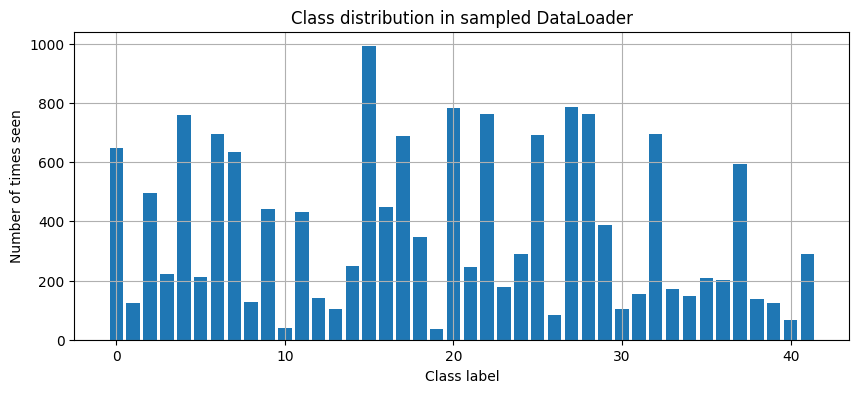

In [ ]:
loader = DataLoader(train_dataset_adj_aug, batch_size=64, sampler = sampler)
analyze_dataloader_class_distribution(loader)

In [ ]:
simple_cnn_vsaug = SimpleCnn(n_classes=n_classes, name = 'simple_cnn_adj_aug_and_oversampling(2)')
simple_cnn_vsaug.to(DEVICE)

history = train(train_dataset_adj_aug, val_dataset_adj_aug, model=simple_cnn_vsaug, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.732694051297457


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.7327     val_loss 2.0000 train_acc 0.2634 val_acc 0.4601


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.4994799991315835


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.4995     val_loss 1.4984 train_acc 0.5944 val_acc 0.5980


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.9081100439507458


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.9081     val_loss 1.3064 train_acc 0.7511 val_acc 0.6693


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6421315196714809


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.6421     val_loss 1.2218 train_acc 0.8236 val_acc 0.7113


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4808202745489379


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.4808     val_loss 1.2586 train_acc 0.8685 val_acc 0.7149


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.36416887159491507


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.3642     val_loss 1.2607 train_acc 0.8986 val_acc 0.7337


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.28913328727999493


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.2891     val_loss 1.3269 train_acc 0.9187 val_acc 0.7428


batch:   0%|          | 0/246 [00:00<?, ?it/s]

## Batch norm and dropout
1. Add batch norm to cnn layers
2. Add dropout to linear layers

#### Batchnorm

In [ ]:
class SimpleCnnBN(nn.Module):

    def __init__(self, n_classes, name = 'simple_cnn_bn'):
        super().__init__()
        self.name = name
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=96, kernel_size=3),
            nn.BatchNorm2d(96),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.out = nn.Linear(96 * 5 * 5, n_classes)


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)

        x = x.view(x.size(0), -1)
        logits = self.out(x)
        return logits

In [ ]:
from torch.utils.data import WeightedRandomSampler

sampler = WeightedRandomSampler(
    weights=weighted_train_files,
    num_samples=len(weighted_train_files),
    replacement=True
)

val_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(val_files, mode='val')
train_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(train_files, mode='train')

In [ ]:
simple_cnn_bn = SimpleCnnBN(n_classes=n_classes, name = 'simple_cnn_adj_aug_oversampling_bn')
simple_cnn_bn.to(DEVICE)

history = train(train_dataset_adj_aug, val_dataset_adj_aug, model=simple_cnn_bn, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.8282080762697197


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 1.8282     val_loss 1.3211 train_acc 0.5146 val_acc 0.6351


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.9258242064474859


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.9258     val_loss 1.0807 train_acc 0.7455 val_acc 0.7107


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5389635002406526


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.5390     val_loss 0.8904 train_acc 0.8520 val_acc 0.7782


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.35670033055882944


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.3567     val_loss 0.9053 train_acc 0.9009 val_acc 0.7749


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2661329239371461


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.2661     val_loss 0.9751 train_acc 0.9243 val_acc 0.8007


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.21246553552257794


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.2125     val_loss 0.8578 train_acc 0.9415 val_acc 0.8126


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.17141520110040162


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.1714     val_loss 0.9365 train_acc 0.9522 val_acc 0.7994


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.13192760181754515


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1319     val_loss 1.0201 train_acc 0.9623 val_acc 0.8101


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.12000275363822797


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1200     val_loss 1.1101 train_acc 0.9627 val_acc 0.8074


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.11308229114561068


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1131     val_loss 1.0312 train_acc 0.9646 val_acc 0.8152


In [ ]:
def calc_f1(val_dataset, model):
  val_loader = DataLoader(val_dataset, batch_size=256, shuffle=False)

  preds = []

  for batch, y in val_loader:
    out = model(batch.to(DEVICE))
    probs = torch.nn.functional.softmax(out.cpu(), -1).detach().numpy()
    preds.append(probs)

  label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))
  preds = np.concat(preds)
  y_pred = np.argmax(preds, -1)

  actual_labels = [val_dataset[id][1] for id in range(len(val_dataset))]
  preds_class = [label_encoder.classes_[i] for i in y_pred]

  return f1_score(actual_labels, y_pred, average='micro')




In [ ]:
calc_f1(val_dataset_adj_aug, simple_cnn_bn)

In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(simple_cnn_bn, test_loader)


preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]


my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")

my_submit['Expected'] = preds
my_submit['Id'] = test_filenames

my_submit.to_csv('simple_cnn_adj_aug_oversampling_bn.csv', index=False)

In [ ]:
my_submit.head()

,Id,Expected
0,img0.jpg,nelson_muntz
1,img1.jpg,bart_simpson
2,img10.jpg,ned_flanders
3,img100.jpg,chief_wiggum
4,img101.jpg,apu_nahasapeemapetilon


In [ ]:
!pip install kaggle
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle_api_token/kaggle.json ~/.kaggle/


[Errno 2] No such file or directory: '/content/simple_cnn_baseline.csv'
fileName                 date                        description                 status                     publicScore  privateScore  
-----------------------  --------------------------  --------------------------  -------------------------  -----------  ------------  
simple_cnn_baseline.csv  2025-06-16 13:14:37.103000  simple cnn baseline submit  SubmissionStatus.COMPLETE  0.91285                    
simple_cnn_baseline.csv  2025-06-16 13:08:43.417000  simple cnn baseline submit  SubmissionStatus.COMPLETE  0.05419                    


In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_adj_aug_oversampling_bn.csv -m 'adjusted augmentation, oversampling, batch norm'

100% 25.8k/25.8k [00:00<00:00, 33.6kB/s]
Successfully submitted to Journey to Springfield

In [ ]:
!kaggle competitions submissions journey-springfield

fileName                                date                        description                                      status                     publicScore  privateScore  
--------------------------------------  --------------------------  -----------------------------------------------  -------------------------  -----------  ------------  
simple_cnn_adj_aug_oversampling_bn.csv  2025-06-18 18:34:32.343000  adjusted augmentation, oversampling, batch norm  SubmissionStatus.COMPLETE  0.93092                    
simple_cnn_baseline.csv                 2025-06-16 13:14:37.103000  simple cnn baseline submit                       SubmissionStatus.COMPLETE  0.91285                    
simple_cnn_baseline.csv                 2025-06-16 13:08:43.417000  simple cnn baseline submit                       SubmissionStatus.COMPLETE  0.05419                    


And now lets see what will change if we will use light augmentation with BN

In [ ]:
# sampler = WeightedRandomSampler(
#     weights=weighted_train_files,
#     num_samples=len(weighted_train_files),
#     replacement=True
# )
val_dataset_aug = SimpsonsDatasetAug(val_files, mode='val')
train_dataset_aug = SimpsonsDatasetAug(train_files, mode='train')

simple_cnn_bn = SimpleCnnBN(n_classes=n_classes, name = 'simple_cnn_bn')
simple_cnn_bn.to(DEVICE)

history = train(train_dataset_aug, val_dataset_aug, model=simple_cnn_bn, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.917928761430239


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 1.9179     val_loss 1.3687 train_acc 0.4958 val_acc 0.6303


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.9756767809204983


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.9757     val_loss 1.1263 train_acc 0.7339 val_acc 0.7073


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5493432433979246


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.5493     val_loss 0.9844 train_acc 0.8464 val_acc 0.7528


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.3892893519638617


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.3893     val_loss 0.8948 train_acc 0.8893 val_acc 0.7856


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2682219478665655


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.2682     val_loss 0.8784 train_acc 0.9247 val_acc 0.7988


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.20094905864380674


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.2009     val_loss 0.9506 train_acc 0.9437 val_acc 0.7973


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.16574637104055745


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.1657     val_loss 1.0427 train_acc 0.9523 val_acc 0.7845


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.14936617604340033


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1494     val_loss 1.0306 train_acc 0.9573 val_acc 0.8042


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.12018073085850696


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1202     val_loss 1.0397 train_acc 0.9631 val_acc 0.8141


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1101216183429205


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1101     val_loss 1.0608 train_acc 0.9677 val_acc 0.8194


In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(simple_cnn_bn, test_loader)


preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]


my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")

my_submit['Expected'] = preds
my_submit['Id'] = test_filenames

my_submit.to_csv('simple_cnn_base_aug_bn.csv', index=False)

In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_base_aug_bn.csv -m 'adjusted augmentation, oversampling, batch norm'

100% 25.8k/25.8k [00:00<00:00, 33.8kB/s]
Successfully submitted to Journey to Springfield

In [ ]:
!kaggle competitions submissions journey-springfield

fileName                                date                        description                                      status                     publicScore  privateScore  
--------------------------------------  --------------------------  -----------------------------------------------  -------------------------  -----------  ------------  
simple_cnn_base_aug_bn.csv              2025-06-18 20:17:15.193000  adjusted augmentation, oversampling, batch norm  SubmissionStatus.COMPLETE  0.92348                    
simple_cnn_adj_aug_oversampling_bn.csv  2025-06-18 18:34:32.343000  adjusted augmentation, oversampling, batch norm  SubmissionStatus.COMPLETE  0.93092                    
simple_cnn_baseline.csv                 2025-06-16 13:14:37.103000  simple cnn baseline submit                       SubmissionStatus.COMPLETE  0.91285                    
simple_cnn_baseline.csv                 2025-06-16 13:08:43.417000  simple cnn baseline submit                       SubmissionStatus.COMPLE

#### Dropout
Adding another linear layer and dropout

In [ ]:
class SimpleCnnBN_2linear(nn.Module):

    def __init__(self, n_classes, name = 'simple_cnn_bn', dropout = False):
        super().__init__()
        self.name = name
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(in_channels=8, out_channels=16, kernel_size=3),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv3 = nn.Sequential(
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv4 = nn.Sequential(
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.conv5 = nn.Sequential(
            nn.Conv2d(in_channels=64, out_channels=96, kernel_size=3),
            nn.BatchNorm2d(96),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )
        self.flatten = nn.Linear(96 * 5 * 5, 256)
        self.act =nn.ReLU()
        self.dropout = dropout
        if dropout:
          self.dropout = nn.Dropout(p = 0.5)
        self.out = nn.Linear(256, n_classes)


    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)

        x = x.view(x.size(0), -1)
        if self.dropout:
          logits = self.out(self.dropout(self.act(self.flatten(x))))
        else:
          logits = self.out(self.act(self.flatten(x)))

        return logits

In [ ]:
sampler = WeightedRandomSampler(
    weights=weighted_train_files,
    num_samples=len(weighted_train_files),
    replacement=True
)

val_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(val_files, mode='val')
train_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(train_files, mode='train')

W/o dropout

In [ ]:
model = SimpleCnnBN_2linear(n_classes=n_classes, name = 'simple_cnn_bn_2linear')
model.to(DEVICE)

history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.9824837024017947


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 1.9825     val_loss 1.3906 train_acc 0.4735 val_acc 0.6221


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.0406193422226322


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.0406     val_loss 1.1618 train_acc 0.7135 val_acc 0.6815


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5891924413634497


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.5892     val_loss 1.0069 train_acc 0.8357 val_acc 0.7434


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.3881309013921703


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.3881     val_loss 0.9440 train_acc 0.8916 val_acc 0.7663


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.25733029371963595


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.2573     val_loss 0.9158 train_acc 0.9245 val_acc 0.7948


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.21251552243454153


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.2125     val_loss 0.9489 train_acc 0.9395 val_acc 0.7971


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.15769361337018367


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.1577     val_loss 0.9353 train_acc 0.9524 val_acc 0.8114


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1335692038814523


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1336     val_loss 1.0396 train_acc 0.9606 val_acc 0.8028


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.10345568884306709


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1035     val_loss 1.0343 train_acc 0.9689 val_acc 0.8057


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.09697347342174474


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.0970     val_loss 1.2676 train_acc 0.9700 val_acc 0.7921


Activating dropout

In [ ]:
model = SimpleCnnBN_2linear(n_classes=n_classes, name = 'simple_cnn_bn_2linear', dropout = True)
model.to(DEVICE)

history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.910488250050714


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.9105     val_loss 2.0720 train_acc 0.2194 val_acc 0.4446


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.4814451615349777


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.4814     val_loss 1.2272 train_acc 0.5937 val_acc 0.6720


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.7992442061460066


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.7992     val_loss 1.0553 train_acc 0.7804 val_acc 0.7375


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5044996114348642


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.5045     val_loss 0.9678 train_acc 0.8580 val_acc 0.7642


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.32536203015119425


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.3254     val_loss 0.9731 train_acc 0.9069 val_acc 0.7679


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.24022583388344057


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.2402     val_loss 0.9747 train_acc 0.9304 val_acc 0.8000


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.18364719921026904


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.1836     val_loss 1.0513 train_acc 0.9473 val_acc 0.8078


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1447315089555206


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1447     val_loss 0.9844 train_acc 0.9576 val_acc 0.8107


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.10938990682969087


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.1094     val_loss 1.1428 train_acc 0.9672 val_acc 0.8026


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.11831098707612665


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.1183     val_loss 1.0696 train_acc 0.9638 val_acc 0.8216


### Other architectural experiments


#### Skip connections

In [ ]:
class ResidualBlock(nn.Module):
  def __init__(self, in_channels, out_channels, downsample):
    super().__init__()
    stride = 2 if downsample else 1

    self.convblock = nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size = 3, stride = stride, padding = 1),
        nn.BatchNorm2d(out_channels),
        nn.ReLU(),
        nn.Conv2d(out_channels, out_channels, kernel_size = 3, stride = 1, padding = 1),
        nn.BatchNorm2d(out_channels)
    )

    self.skip = nn.Identity()
    if in_channels != out_channels or downsample:
      self.skip = nn.Sequential(
          nn.Conv2d(in_channels, out_channels, kernel_size = 1, stride = stride),
          nn.BatchNorm2d(out_channels)
      )
    self.relu = nn.ReLU()

  def forward(self, x):
    out = self.convblock(x)
    out += self.skip(x)
    return self.relu(out)



class SkipConnectionCNN(nn.Module):
    def __init__(self, n_classes, name = 'simple_cnn_bn', avg_pool = False, dropout = False):
        super().__init__()
        self.name = name
        self.avg_pool = avg_pool
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=8, kernel_size=3),
            nn.BatchNorm2d(8),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.res1 = ResidualBlock(8, 16, downsample=True)
        self.res2 = ResidualBlock(16, 32, downsample=True)
        self.res3 = ResidualBlock(32, 64, downsample=True)
        self.res4 = ResidualBlock(64, 96, downsample=True)

        if not(avg_pool):
          self.head = nn.Sequential(
            nn.Linear(96 * 7 * 7, 1024),
            nn.ReLU(),
            nn.Dropout(p = 0.5) if dropout else nn.Identity(),
            nn.Linear(1024, n_classes)
          )
        else:
          self.ad_avg_pool = nn.AdaptiveAvgPool2d((1,1))
          self.head = nn.Sequential(
              nn.Linear(96, 256),
              nn.Droput(p = .5) if dropout else nn.Identity(),
              nn.Linear(256, n_classes)
          )



    def forward(self, x):
        x = self.conv1(x)
        x = self.res1(x)
        x = self.res2(x)
        x = self.res3(x)
        x = self.res4(x)
        if self.avg_pool:
          x = self.ad_avg_pool(x)
        x = x.view(x.size(0), -1)
        logits = self.head(x)

        return logits

In [ ]:
sampler = WeightedRandomSampler(
    weights=weighted_train_files,
    num_samples=len(weighted_train_files),
    replacement=True
)

val_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(val_files, mode='val')
train_dataset_adj_aug = SimpsonsDatasetAdjustedAugmentation(train_files, mode='train')

flatten head

In [ ]:
model = SkipConnectionCNN(n_classes=n_classes, name = 'skip_con_flaten_head', dropout = True)
model.to(DEVICE)

history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.668296774509371


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.6683     val_loss 1.7735 train_acc 0.2954 val_acc 0.5075


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.2611129142211588


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.2611     val_loss 1.3008 train_acc 0.6484 val_acc 0.6479


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6219258042488655


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.6219     val_loss 1.1351 train_acc 0.8285 val_acc 0.7151


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.35330060048652795


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.3533     val_loss 1.1339 train_acc 0.9004 val_acc 0.7402


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.23423018658306957


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.2342     val_loss 1.2005 train_acc 0.9319 val_acc 0.7570


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1761561416730705


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.1762     val_loss 1.2266 train_acc 0.9485 val_acc 0.7663


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1437432358459163


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.1437     val_loss 1.1813 train_acc 0.9571 val_acc 0.7686


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.10274787311702123


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1027     val_loss 1.3837 train_acc 0.9697 val_acc 0.7614


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.09386422300745503


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.0939     val_loss 1.4932 train_acc 0.9725 val_acc 0.7474


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.0802537695978217


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.0803     val_loss 1.3568 train_acc 0.9767 val_acc 0.7788


In [ ]:
model = SkipConnectionCNN(n_classes=n_classes, name = 'skip_con_flaten_head', dropout = False)
model.to(DEVICE)

history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=15, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/15 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.268725217447986


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.2687     val_loss 1.5861 train_acc 0.4071 val_acc 0.5630


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.9877468453250012


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.9877     val_loss 1.3118 train_acc 0.7265 val_acc 0.6551


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5042180673395633


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.5042     val_loss 1.1164 train_acc 0.8590 val_acc 0.7283


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.29243822556307714


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.2924     val_loss 1.0440 train_acc 0.9197 val_acc 0.7598


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.21345642160834746


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.2135     val_loss 1.1258 train_acc 0.9389 val_acc 0.7457


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.16963521106233528


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.1696     val_loss 1.1242 train_acc 0.9519 val_acc 0.7803


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1271776991108928


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.1272     val_loss 1.1604 train_acc 0.9647 val_acc 0.7828


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.10954738215691223


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.1095     val_loss 1.2375 train_acc 0.9678 val_acc 0.7782


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.08874628616053061


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.0887     val_loss 1.3162 train_acc 0.9740 val_acc 0.7753


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.08423135924759971


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.0842     val_loss 1.2635 train_acc 0.9760 val_acc 0.7900


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.0995961255016327


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 011 train_loss: 0.0996     val_loss 1.3764 train_acc 0.9696 val_acc 0.7673


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.07348914708259004


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 012 train_loss: 0.0735     val_loss 1.3768 train_acc 0.9774 val_acc 0.7759


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.05585363642493227


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 013 train_loss: 0.0559     val_loss 1.5472 train_acc 0.9816 val_acc 0.7877


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.06426471763837013


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 014 train_loss: 0.0643     val_loss 1.2779 train_acc 0.9811 val_acc 0.8091


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.04154226612967665


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 015 train_loss: 0.0415     val_loss 1.6466 train_acc 0.9873 val_acc 0.7839


adaptive avg pool head


In [ ]:
model = SkipConnectionCNN(n_classes=n_classes, name = 'skip_con_flaten_head', dropout = False, avg_pool = True)
model.to(DEVICE)

history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.6707889702040815


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.6708     val_loss 1.9191 train_acc 0.2985 val_acc 0.4790


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.4860303695888777


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 2.4860     val_loss 1.6932 train_acc 0.3379 val_acc 0.5652


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.559824823649782


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 1.5598     val_loss 1.2336 train_acc 0.5695 val_acc 0.6655


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.127198380955891


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 1.1272     val_loss 1.0190 train_acc 0.6863 val_acc 0.7119


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.8257074285763921


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.8257     val_loss 0.7878 train_acc 0.7661 val_acc 0.7707


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6712745222075516


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.6713     val_loss 0.7972 train_acc 0.8076 val_acc 0.7723


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5181931651650785


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.5182     val_loss 0.7083 train_acc 0.8513 val_acc 0.8042


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4324219329652228


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.4324     val_loss 0.7122 train_acc 0.8780 val_acc 0.8229


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.34962817555370207


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.3496     val_loss 0.6649 train_acc 0.8987 val_acc 0.8368


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2775061856779692


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.2775     val_loss 0.5800 train_acc 0.9210 val_acc 0.8504


resuming training as we see positive dynamic

In [ ]:
history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=5, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.27446044115733476


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.2745     val_loss 0.6147 train_acc 0.9209 val_acc 0.8483


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2401795028942314


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.2402     val_loss 0.6620 train_acc 0.9277 val_acc 0.8428


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2089764813530847


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.2090     val_loss 0.9509 train_acc 0.9383 val_acc 0.8175


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.18101566240663203


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.1810     val_loss 0.7620 train_acc 0.9464 val_acc 0.8407


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.16969861978092757


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.1697     val_loss 0.6583 train_acc 0.9499 val_acc 0.8523


In [ ]:
model = model = SkipConnectionCNN(n_classes=n_classes, name = 'skip_con_flaten_head', dropout = False, avg_pool = True)
model.load_state_dict(torch.load('/content/drive/MyDrive/simpsons_hw/skip_con_flaten_head_2025-06-19 11:29:18.955046', weights_only = True))
model.to(DEVICE)
model.eval()

SkipConnectionCNN(
  (conv1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): ResidualBlock(
    (convblock): Sequential(
      (0): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (skip): Sequential(
      (0): Conv2d(8, 16, kernel_size=(1, 1), stride=(2, 2))
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (relu): ReLU()
  )
  (res2): ResidualBlock(
    (convblock): Sequential(
      (0): Conv2d(16, 32, kernel_size=

In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(model, test_loader)

label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))
preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]


my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")

my_submit['Expected'] = preds
my_submit['Id'] = test_filenames

my_submit.to_csv('simple_cnn_base_aug_bn.csv', index=False)

In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_base_aug_bn.csv -m 'residual connection blocks + adj aug'

100% 25.9k/25.9k [00:00<00:00, 75.9kB/s]
Successfully submitted to Journey to Springfield

In [ ]:
!kaggle competitions submissions journey-springfield

fileName                                date                        description                                      status                     publicScore  privateScore  
--------------------------------------  --------------------------  -----------------------------------------------  -------------------------  -----------  ------------  
simple_cnn_base_aug_bn.csv              2025-06-19 11:41:58.010000  residual connection blocks + adj aug             SubmissionStatus.COMPLETE  0.92879                    
simple_cnn_base_aug_bn.csv              2025-06-19 11:36:35.857000  residual connection blocks + adj aug             SubmissionStatus.COMPLETE  0.92879                    
simple_cnn_base_aug_bn.csv              2025-06-18 20:17:15.193000  adjusted augmentation, oversampling, batch norm  SubmissionStatus.COMPLETE  0.92348                    
simple_cnn_adj_aug_oversampling_bn.csv  2025-06-18 18:34:32.343000  adjusted augmentation, oversampling, batch norm  SubmissionStatus.COMPLE

#### Inception blocks

```
                   [in_channels]
                         |
      ---------------------------------------------------
     |            |                   |                |
  1x1 Conv     1x1→3x3 Conv       1x1→5x5 Conv   3x3 MaxPool→1x1
   out_1x1     red_3x3→out_3x3    red_5x5→out_5x5     pool_proj
     |            |                   |                |
      ------------concat (dim=1)------------------------> [C_out]
```

In [ ]:
class InceptionBlock(nn.Module):
  def __init__(self, in_channels, out1x1, red3x3, out3x3, red5x5, out5x5, pool_proj):
    super().__init__()

    self.branch1 = nn.Sequential(
        nn.Conv2d(in_channels, out1x1, kernel_size = 1),
        nn.BatchNorm2d(out1x1),
        nn.ReLU()
    )

    self.branch2 = nn.Sequential(
        nn.Conv2d(in_channels, red3x3, kernel_size = 1),
        nn.BatchNorm2d(red3x3),
        nn.ReLU(),
        nn.Conv2d(red3x3, out3x3, kernel_size = 3, padding = 1),
        nn.BatchNorm2d(out3x3),
        nn.ReLU()
    )

    self.branch3 = nn.Sequential(
        nn.Conv2d(in_channels, red5x5, kernel_size = 1),
        nn.BatchNorm2d(red5x5),
        nn.ReLU(),
        nn.Conv2d(red5x5, out5x5, kernel_size = 3, padding = 1),
        nn.BatchNorm2d(out5x5),
        nn.ReLU()
    )

    self.branch4 = nn.Sequential(
        nn.MaxPool2d(kernel_size = 3, stride = 1, padding = 1),
        nn.Conv2d(in_channels, pool_proj, kernel_size=1),
        nn.BatchNorm2d(pool_proj),
        nn.ReLU()
    )


  def forward(self, x):
    out1 = self.branch1(x)
    out2 = self.branch2(x)
    out3 = self.branch3(x)
    out4 = self.branch4(x)

    return torch.cat([out1, out2, out3, out4], dim = 1)

In [ ]:
class InceptionSkipConnectionCNN(nn.Module):
    def __init__(self, n_classes, name = 'Inception_skip_connection', dropout = False):
        super().__init__()
        self.name = name
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=32, kernel_size=3, padding = 1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2)
        )

        self.res1 = ResidualBlock(32, 64, downsample=True)
        self.incep1 = InceptionBlock(
            in_channels=64,
            out1x1=32,
            red3x3=32, out3x3=64,
            red5x5=16, out5x5=32,
            pool_proj=32
        )  # → out_channels = 32+64+32+32 = 160

        self.res2 = ResidualBlock(160, 128, downsample=True)
        self.incep2 = InceptionBlock(
            in_channels=128,
            out1x1=32,
            red3x3=32, out3x3=64,
            red5x5=16, out5x5=32,
            pool_proj=32
        )  # → 160 снова

        self.res3 = ResidualBlock(160, 256, downsample=True)
        self.res4 = ResidualBlock(256, 196, downsample=True)
        self.res5 = ResidualBlock(196, 128, downsample=True)


        self.ad_avg_pool = nn.AdaptiveAvgPool2d((1,1))
        self.head = nn.Sequential(
              nn.Linear(128, 256),
              nn.Droput(p = .5) if dropout else nn.Identity(),
              nn.Linear(256, n_classes)
          )



    def forward(self, x):
        x = self.conv1(x)
        x = self.res1(x)
        x = self.incep1(x)
        x = self.res2(x)
        x = self.incep2(x)
        x = self.res3(x)
        x = self.res4(x)
        x = self.res5(x)
        x = self.ad_avg_pool(x)
        x = x.view(x.size(0), -1)
        logits = self.head(x)

        return logits

In [ ]:
model = InceptionSkipConnectionCNN(n_classes=n_classes, name = 'skip_con_inception_adj_avg', dropout = False)
model.to(DEVICE)

history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.2237869458286936


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.2238     val_loss 1.2539 train_acc 0.3971 val_acc 0.6699


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 3.2462807580220243


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 3.2463     val_loss 2.4941 train_acc 0.1325 val_acc 0.3074


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.3140931791375037


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 2.3141     val_loss 1.8875 train_acc 0.3559 val_acc 0.4876


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.6718351870511352


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 1.6718     val_loss 1.3934 train_acc 0.5204 val_acc 0.6160


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.1474956123758573


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 1.1475     val_loss 1.1032 train_acc 0.6693 val_acc 0.7081


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.7680650725244101


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.7681     val_loss 0.9181 train_acc 0.7765 val_acc 0.7572


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5666530207772416


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.5667     val_loss 0.8631 train_acc 0.8367 val_acc 0.7799


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.41464979256465256


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.4146     val_loss 0.8648 train_acc 0.8765 val_acc 0.7866


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.3174550168183482


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.3175     val_loss 0.8110 train_acc 0.9052 val_acc 0.8124


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2471307732529819


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.2471     val_loss 0.7597 train_acc 0.9259 val_acc 0.8280


In [ ]:
history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=5, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2316757580642108


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.2317     val_loss 0.8033 train_acc 0.9310 val_acc 0.8193


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.20102802955676768


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.2010     val_loss 0.9461 train_acc 0.9387 val_acc 0.7944


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.17287360810142535


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.1729     val_loss 0.6812 train_acc 0.9489 val_acc 0.8410


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1339135263714337


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.1339     val_loss 0.8309 train_acc 0.9597 val_acc 0.8410


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1204736659413531


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.1205     val_loss 0.8094 train_acc 0.9629 val_acc 0.8489


последний эксперимент с самописными моделями - обучить их на датасете без выравнивания выборки и слабой аугментацией



In [ ]:
val_dataset_adj_aug = SimpsonsDataset(val_files, mode='val')
train_dataset_adj_aug = SimpsonsDataset(train_files, mode='train')


In [ ]:
model = SkipConnectionCNN(n_classes=n_classes, name = 'skip_con_no_aug', dropout = False, avg_pool = True)
model.to(DEVICE)

history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=model, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.703347909191595


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.7033     val_loss 2.4953 train_acc 0.2749 val_acc 0.3846


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.49494723091688


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 2.4949     val_loss 1.6189 train_acc 0.3277 val_acc 0.5634


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.5604883805529557


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 1.5605     val_loss 1.2379 train_acc 0.5633 val_acc 0.6572


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.115941905312435


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 1.1159     val_loss 1.0925 train_acc 0.6855 val_acc 0.6890


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.8643690331269696


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.8644     val_loss 0.8298 train_acc 0.7558 val_acc 0.7738


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6365135655873019


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.6365     val_loss 0.7513 train_acc 0.8199 val_acc 0.7998


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5215868832277366


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.5216     val_loss 0.7802 train_acc 0.8522 val_acc 0.8068


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.41779953761308525


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.4178     val_loss 0.7175 train_acc 0.8783 val_acc 0.8143


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.3323438124023689


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.3323     val_loss 0.7118 train_acc 0.9001 val_acc 0.8301


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.28395636087466564


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.2840     val_loss 0.8343 train_acc 0.9183 val_acc 0.8084


## Other models
Resnet, Inception (pretrained)
  - Froze all layers but last one
  - Let few upper layers learn
  - Let all of the layers learn

#### Resnet 18



In [ ]:
import torchvision.models as models

resnet18 = models.resnet18(pretrained = True)
resnet18

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
for param in resnet18.parameters():
  param.requires_grad = False

resnet18.fc = nn.Linear(resnet18.fc.in_features, n_classes)

In [ ]:
resnet18.fc

Linear(in_features=512, out_features=42, bias=True)

In [ ]:
class name_wrapper(nn.Module):
  def __init__(self, model, name):
    super().__init__()
    self.name = name
    self.model = model

  def forward(self, x):
    return self.model(x)

Learning fc layer

In [ ]:


resnet18.to(DEVICE)

named_resnet18 = name_wrapper(resnet18, name = 'resne18_adj_aug')


history = train(val_dataset_adj_aug, train_dataset_adj_aug, model=named_resnet18, epochs=10, batch_size=64, wrs=sampler)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 2.412683147641153


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 2.4127     val_loss 1.5814 train_acc 0.4286 val_acc 0.6702


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.3933111080448144


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 1.3933     val_loss 1.1983 train_acc 0.6809 val_acc 0.7170


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 1.0758011990105607


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 1.0758     val_loss 1.0894 train_acc 0.7496 val_acc 0.7272


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.9341039549120597


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.9341     val_loss 1.0137 train_acc 0.7785 val_acc 0.7442


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.8469325836786564


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.8469     val_loss 0.9367 train_acc 0.7929 val_acc 0.7577


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.779447675802972


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.7794     val_loss 0.9154 train_acc 0.8090 val_acc 0.7545


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.7290412229112367


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.7290     val_loss 0.8982 train_acc 0.8183 val_acc 0.7650


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6901659975272697


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.6902     val_loss 0.8624 train_acc 0.8285 val_acc 0.7711


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6603732161198735


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.6604     val_loss 0.8769 train_acc 0.8334 val_acc 0.7673


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.6352518121333128


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.6353     val_loss 0.8501 train_acc 0.8362 val_acc 0.7749


In [ ]:
named_resnet18.model

Unfrozing last conv layer model

In [ ]:
for par in named_resnet18.model.layer4.parameters():
  param.requires_grad = True


In [ ]:
lr_list = [
    {'params':named_resnet18.model.fc.parameters(), 'lr': 1e-3},
    {'params':named_resnet18.model.layer4.parameters(), 'lr':1e-4}
]

In [ ]:
history = train(val_dataset_adj_aug,
                train_dataset_adj_aug,
                model=named_resnet18,
                epochs=10,
                batch_size=64,
                wrs=sampler,
                lr = lr_list)

epoch:   0%|          | 0/10 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5589188845326654


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.5589     val_loss 0.8379 train_acc 0.8532 val_acc 0.7726


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5466328622091423


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.5466     val_loss 0.8382 train_acc 0.8564 val_acc 0.7767


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.525659615934347


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.5257     val_loss 0.8462 train_acc 0.8613 val_acc 0.7713


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.5195098039837991


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.5195     val_loss 0.8279 train_acc 0.8623 val_acc 0.7768


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.504898768962208


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.5049     val_loss 0.8233 train_acc 0.8655 val_acc 0.7778


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4898083629908247


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.4898     val_loss 0.8335 train_acc 0.8703 val_acc 0.7742


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.47646922797593


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.4765     val_loss 0.8325 train_acc 0.8687 val_acc 0.7791


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.483239003522919


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.4832     val_loss 0.8165 train_acc 0.8718 val_acc 0.7824


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4697340477256306


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.4697     val_loss 0.8391 train_acc 0.8747 val_acc 0.7763


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.466162065319426


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.4662     val_loss 0.8227 train_acc 0.8733 val_acc 0.7784


Unfrozing one more conv layer

In [ ]:
for par in named_resnet18.model.layer3.parameters():
  param.requires_grad = True

In [ ]:
lr_list = [
    {'params':named_resnet18.model.fc.parameters(), 'lr': 1e-3},
    {'params':named_resnet18.model.layer4.parameters(), 'lr':1e-3},
    {'params':named_resnet18.model.layer3.parameters(), 'lr':1e-4}
]

history = train(val_dataset_adj_aug,
                train_dataset_adj_aug,
                model=named_resnet18,
                epochs=5,
                batch_size=64,
                wrs=sampler,
                lr = lr_list)

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.46593410105103555


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.4659     val_loss 0.8220 train_acc 0.8721 val_acc 0.7839


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.45101112451163955


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.4510     val_loss 0.8218 train_acc 0.8762 val_acc 0.7789


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4354762723775599


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.4355     val_loss 0.8257 train_acc 0.8829 val_acc 0.7828


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4392944594440707


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.4393     val_loss 0.8512 train_acc 0.8819 val_acc 0.7761


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.4372395797799868


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.4372     val_loss 0.8396 train_acc 0.8793 val_acc 0.7807


Unfrozing all model

In [ ]:
for par in named_resnet18.model.parameters():
  par.requires_grad = True

In [ ]:
history = train(val_dataset_adj_aug,
                train_dataset_adj_aug,
                model=named_resnet18,
                epochs=5,
                batch_size=64,
                wrs=sampler
                )

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.515635723997145


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.5156     val_loss 0.6409 train_acc 0.8735 val_acc 0.8491


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.2008883971204818


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.2009     val_loss 0.5433 train_acc 0.9438 val_acc 0.8840


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.10586479101388178


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.1059     val_loss 0.5020 train_acc 0.9715 val_acc 0.8871


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.12596059271315788


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.1260     val_loss 0.3341 train_acc 0.9660 val_acc 0.9219


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.08623109863244277


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.0862     val_loss 0.4048 train_acc 0.9757 val_acc 0.9077


#### Resnet 50
как так вышло, что оно обучалось с 1000 выходами на линейном слое?

In [ ]:
import torchvision.models as models

resnet50 = models.resnet50(pretrained = True)
resnet50.fc = nn.Linear(2048, n_classes)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
resnet50

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
resnet50.to(DEVICE)

named_resnet50 = name_wrapper(resnet50, name = 'resnet50_adj_aug')


In [ ]:
for par in named_resnet50.model.fc.parameters():
  par.requires_grad = True

for par in named_resnet50.model.layer4.parameters():
  par.requires_grad = True


In [ ]:
lr_list = [
    {'params':named_resnet50.model.fc.parameters(), 'lr': 1e-3},
    {'params':named_resnet50.model.layer4.parameters(), 'lr':1e-4}
]

In [ ]:
history = train(val_dataset_adj_aug,
                train_dataset_adj_aug,
                model=named_resnet50,
                epochs=5,
                batch_size=64,
                wrs=sampler
                )

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.8014766872346808


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.8015     val_loss 1.3207 train_acc 0.7890 val_acc 0.6886


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.31756694678387315


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.3176     val_loss 0.5118 train_acc 0.9115 val_acc 0.8701


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1973953579292456


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.1974     val_loss 0.3968 train_acc 0.9467 val_acc 0.9066


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.15700306576660114


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.1570     val_loss 0.4390 train_acc 0.9584 val_acc 0.8911


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.14720585094580332


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.1472     val_loss 0.3190 train_acc 0.9583 val_acc 0.9157


submit

In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(named_resnet50, test_loader)

label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))
preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]


my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")

my_submit['Expected'] = preds
my_submit['Id'] = test_filenames

my_submit.to_csv('simple_cnn_base_aug_bn.csv', index=False)

In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_base_aug_bn.csv -m 'resnet50 finetune + adj aug'

100% 25.7k/25.7k [00:00<00:00, 34.5kB/s]
Successfully submitted to Journey to Springfield

In [ ]:
!kaggle competitions submissions journey-springfield

fileName                                date                        description                                      status                     publicScore  privateScore  
--------------------------------------  --------------------------  -----------------------------------------------  -------------------------  -----------  ------------  
simple_cnn_base_aug_bn.csv              2025-06-20 15:14:38.457000  resnet50 finetune + adj aug                      SubmissionStatus.COMPLETE  0.93836                    
simple_cnn_base_aug_bn.csv              2025-06-19 11:41:58.010000  residual connection blocks + adj aug             SubmissionStatus.COMPLETE  0.92879                    
simple_cnn_base_aug_bn.csv              2025-06-19 11:36:35.857000  residual connection blocks + adj aug             SubmissionStatus.COMPLETE  0.92879                    
simple_cnn_base_aug_bn.csv              2025-06-18 20:17:15.193000  adjusted augmentation, oversampling, batch norm  SubmissionStatus.COMPLE

In [ ]:
lr_list = [
    {'params':named_resnet50.model.fc.parameters(), 'lr': 1e-3},
    {'params':named_resnet50.model.layer4.parameters(), 'lr':1e-4},
    {'params':named_resnet50.model.layer4.parameters(), 'lr':1e-5}
]

In [ ]:
for par in named_resnet50.model.layer3.parameters():
  par.requires_grad = True

In [ ]:
history = train(val_dataset_adj_aug,
                train_dataset_adj_aug,
                model=named_resnet50,
                epochs=5,
                batch_size=64,
                wrs=sampler
                )

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.1543872439258545


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.1544     val_loss 0.3521 train_acc 0.9553 val_acc 0.9163


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.12761058700315148


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.1276     val_loss 0.2890 train_acc 0.9643 val_acc 0.9289


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.0993100294105448


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.0993     val_loss 0.3197 train_acc 0.9726 val_acc 0.9257


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.07673329113774925


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.0767     val_loss 0.3103 train_acc 0.9801 val_acc 0.9293


batch:   0%|          | 0/246 [00:00<?, ?it/s]

loss 0.0910048870086462


batch:   0%|          | 0/82 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.0910     val_loss 0.3227 train_acc 0.9739 val_acc 0.9263


In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(named_resnet50, test_loader)

label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))
preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]


my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")

my_submit['Expected'] = preds
my_submit['Id'] = test_filenames

my_submit.to_csv('simple_cnn_base_aug_bn.csv', index=False)

In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_base_aug_bn.csv -m 'resnet50 finetune + adj aug'

BEST RESULT

In [ ]:
import torchvision.models as models

class name_wrapper(nn.Module):
  def __init__(self, model, name):
    super().__init__()
    self.name = name
    self.model = model

  def forward(self, x):
    return self.model(x)

resnet50 = models.resnet50(pretrained = True)
resnet50.fc = nn.Linear(2048, n_classes)
resnet50.to(DEVICE)

named_resnet50 = name_wrapper(resnet50, name = 'resnet50_adj_aug')

In [ ]:
history = train(train_dataset,
                val_dataset,
                model=named_resnet50,
                epochs=20,
                batch_size=128,
                lr = 0.0003)

epoch:   0%|          | 0/20 [00:00<?, ?it/s]

batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.6270588908503072


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 001 train_loss: 0.6271     val_loss 0.3810 train_acc 0.8478 val_acc 0.8985


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.2745818329875083


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 002 train_loss: 0.2746     val_loss 0.3049 train_acc 0.9268 val_acc 0.9211


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.17728657484686688


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 003 train_loss: 0.1773     val_loss 0.2709 train_acc 0.9530 val_acc 0.9312


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.13938459644080495


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 004 train_loss: 0.1394     val_loss 0.1740 train_acc 0.9613 val_acc 0.9536


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.10331473634449932


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 005 train_loss: 0.1033     val_loss 0.1551 train_acc 0.9724 val_acc 0.9608


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.08406007933968578


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 006 train_loss: 0.0841     val_loss 0.1142 train_acc 0.9783 val_acc 0.9668


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.06845522825110319


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 007 train_loss: 0.0685     val_loss 0.1782 train_acc 0.9808 val_acc 0.9568


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.0478590452444825


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 008 train_loss: 0.0479     val_loss 0.0549 train_acc 0.9869 val_acc 0.9851


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.06166615044847697


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 009 train_loss: 0.0617     val_loss 0.1001 train_acc 0.9818 val_acc 0.9700


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.05290171541072496


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 010 train_loss: 0.0529     val_loss 0.0527 train_acc 0.9844 val_acc 0.9841


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.04304944015268793


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 011 train_loss: 0.0430     val_loss 0.0354 train_acc 0.9879 val_acc 0.9885


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.03779198315375591


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 012 train_loss: 0.0378     val_loss 0.0388 train_acc 0.9885 val_acc 0.9876


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.03968609123318705


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 013 train_loss: 0.0397     val_loss 0.0717 train_acc 0.9879 val_acc 0.9822


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.023437401912197054


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 014 train_loss: 0.0234     val_loss 0.0189 train_acc 0.9925 val_acc 0.9945


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.032039640405937986


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 015 train_loss: 0.0320     val_loss 0.0400 train_acc 0.9912 val_acc 0.9887


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.03782897736288681


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 016 train_loss: 0.0378     val_loss 0.0979 train_acc 0.9891 val_acc 0.9717


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.05159104289920788


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 017 train_loss: 0.0516     val_loss 0.0472 train_acc 0.9864 val_acc 0.9874


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.03735321241803814


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 018 train_loss: 0.0374     val_loss 0.0206 train_acc 0.9901 val_acc 0.9929


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.01943989335892321


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 019 train_loss: 0.0194     val_loss 0.0147 train_acc 0.9950 val_acc 0.9962


batch:   0%|          | 0/164 [00:00<?, ?it/s]

loss 0.010951787835577969


batch:   0%|          | 0/41 [00:00<?, ?it/s]


Epoch 020 train_loss: 0.0110     val_loss 0.0083 train_acc 0.9971 val_acc 0.9975


In [ ]:
test_dataset = SimpsonsDataset(test_files, mode="test")
test_loader = DataLoader(test_dataset, shuffle=False, batch_size=256)
probs = predict(named_resnet50, test_loader)

label_encoder = pickle.load(open("label_encoder.pkl", 'rb'))
preds = label_encoder.inverse_transform(np.argmax(probs, axis=1))
test_filenames = [path.name for path in test_dataset.files]


my_submit = pd.read_csv("/content/simpsons/sample_submission.csv")

my_submit['Expected'] = preds
my_submit['Id'] = test_filenames

my_submit.to_csv('simple_cnn_base_aug_bn.csv', index=False)

In [ ]:
!kaggle competitions submit -c journey-springfield -f /content/simple_cnn_base_aug_bn.csv -m 'resnet50 - 20 epochs'

100% 25.8k/25.8k [00:00<00:00, 43.0kB/s]
Successfully submitted to Journey to Springfield

In [ ]:
!kaggle competitions submissions journey-springfield

fileName                                date                        description                                      status                     publicScore  privateScore  
--------------------------------------  --------------------------  -----------------------------------------------  -------------------------  -----------  ------------  
simple_cnn_base_aug_bn.csv              2025-06-23 14:08:31.327000  resnet50 - 20 epochs                             SubmissionStatus.COMPLETE  0.99787                    
simple_cnn_base_aug_bn.csv              2025-06-20 15:14:38.457000  resnet50 finetune + adj aug                      SubmissionStatus.COMPLETE  0.93836                    
simple_cnn_base_aug_bn.csv              2025-06-19 11:41:58.010000  residual connection blocks + adj aug             SubmissionStatus.COMPLETE  0.92879                    
simple_cnn_base_aug_bn.csv              2025-06-19 11:36:35.857000  residual connection blocks + adj aug             SubmissionStatus.COMPLE

Попробовать обучить по шагам - fc, layer4, layer3

#### Densnet - 121

In [ ]:
densenet121 = models.densenet121(pretrained = True)
densenet121.classifier = nn.Sequential(
    #nn.Linear(1024, 512),
    #nn.Linear()
    nn.Linear(1024, n_classes)
)

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
densenet121.to(DEVICE)

named_densenet121 = name_wrapper(densenet121, name = 'densenet121_adj_aug')

In [ ]:
densenet121

DenseNet(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

In [ ]:
for par in densenet121.parameters():
  par.requires_grad = False

In [ ]:
for par in densenet121.classifier.parameters():
  par.requires_grad = True

for par in densenet121.denseblock4.parameters():
  par.requires_grad = True

AttributeError: 'DenseNet' object has no attribute 'denseblock4'

In [ ]:
history = train(val_dataset_adj_aug,
                train_dataset_adj_aug,
                model=named_densenet121,
                epochs=5,
                batch_size=64,
                wrs=sampler
                )

epoch:   0%|          | 0/5 [00:00<?, ?it/s]

batch:   0%|          | 0/246 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 24.00 MiB. GPU 0 has a total capacity of 14.74 GiB of which 22.12 MiB is free. Process 5163 has 14.72 GiB memory in use. Of the allocated memory 14.39 GiB is allocated by PyTorch, and 190.48 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)